In [3]:
from libraries import *
from utils import *
import traceback
import logging

def compute_landmarks(i_path,
                      o_path,
                      mirror=False,
                      plot_landmarks=True,
                      sample_size=None,
                      zoom=1):

    # supported image format
    EXT_RECURSIVE = ['**/*.jpg', '**/*.JPG', '**/*.png']
    EXT = ['.jpg', '.JPG', '.png']

    # predictor path
    pred_path = os.path.join('../resources/models/dlib', 'shape_predictor_68_face_landmarks.dat')

    # create folders
    o_p = os.path.join(o_path, 'landmarks')
    no_face_detected_images_p = os.path.join(o_p, 'no_face_detected_images')
    if not os.path.exists(o_p): os.makedirs(o_p)
    if not os.path.exists(no_face_detected_images_p): os.makedirs(no_face_detected_images_p)

    else: print('Warning: "%s" folder already exists: adding files..' %o_p)

    # ims_path_list = glob(os.path.join(i_path, '*.jpg'))
    # if not sample_size: sample_size = len(ims_path_list)
    #
    # for i in ims_path_list[:sample_size]:

    # images paths list
    i_pl = reduce(operator.add,
                  [glob(os.path.join(i_path, i), recursive=True) for i in EXT_RECURSIVE],
                  [])
    if not sample_size: sample_size = len(i_pl)

    print('Total available images: %d' %len(i_pl))

    for i in i_pl[:sample_size]:
        # i = i.encode('utf-8',  'surrogateescape')
        # i = i.encode('utf-8')
        # i = i.encode('utf-8', 'surrogateescape').decode('utf-8')
        # i = i.encode('utf-8',  'ignore').decode('utf-8')
        # print(i, type(i))
        # print(i_path)
        if i_path in ['../../../datasets/FDDB/originalPics']:
            f_name = i.split('/')[-5] + i.split('/')[-4] + i.split('/')[-3] + i.split('/')[-2] + i.split('/')[-1].split('.')[0]
        else: f_name = i.split('/')[-1].split('.')[0]

        if f_name.split('_')[-1] == 'mirror' and not mirror: continue
        if f_name.split('_')[-1] != 'mirror' and mirror == 'only': continue
                                         
        # skip if already exists
        if len(glob(os.path.join(o_p, f_name + '.pts'))) > 0 or \
           len(reduce(operator.add, [glob(os.path.join(no_face_detected_images_p, f_name) + i) for i in EXT], [])) > 0: 
                print(f_name, "already computed")
                continue

        print('Processing file: %s @ zoom %d' %(i, zoom))
        
        # https://stackoverflow.com/questions/43185605/how-do-i-read-an-image-from-a-path-with-unicode-characters
        # im = cv2.imdecode(np.asarray(bytearray(open(i, 'br').read()), dtype=np.uint8),
        #                   cv2.IMREAD_UNCHANGED)

        im = cv2.imread(i, cv2.IMREAD_UNCHANGED)
        # print(im.shape) #.astype(np.float32)

        face_det = dlib.get_frontal_face_detector()
        shape_pred = dlib.shape_predictor(pred_path)
        try: dets = face_det(im, zoom)
        # second argument indicates the number of times
        # we should upsample the image in order to detect more faces.
        except Exception as e: logging.error(traceback.format_exc())

        if len(dets) == 0: 
            rotate = True
            while rotate:
                for r in range(4):
                    print('Rotation %d' %r)
                    imr = np.rot90(im, r + 1, axes=(1, 0))
                    face_det = dlib.get_frontal_face_detector()
                    shape_pred = dlib.shape_predictor(pred_path)
                    dets = face_det(imr, zoom)
                    if len(dets) != 0: 
                        rotate = False
                        ('No landamarks found after %d rotations' %r)
                        break
                    else: plot_im(imr)
                break
                              
        # second argument indicates the number of times
        # we should upsample the image in order to detect more faces.
        
        if len(dets) == 0:
            print('No faces detected for file: %s' %i)
            cv2.imwrite(os.path.join(no_face_detected_images_p, f_name + '.png'),  im)

        else:
            for _, i in enumerate(dets):
                (x0, y0, x1, y1) = i.left(), i.top(), i.right(), i.bottom();
                # get the landmarks/parts for the face in box
                landmarks = shape_to_np(shape_pred(im, i))
                save_landmarks_as_pts(landmarks, o_p, f_name)

                if plot_landmarks:
                    for _, i in enumerate(landmarks):
                        point = (i[0], i[1])
                        cv2.circle(im, point, 1, (0, 0, 255), -1)
                        cv2.imwrite(os.path.join(o_p, f_name + '_landmarked.png'),  im)

    n_im = len(glob(os.path.join(o_p, '*.pts')))
    print('Total computed landmarks files: %d' %n_im)

In [4]:
import sys
sys.path.append('../../../utils')
import utils
import libraries
# reload(utils)
# reload(libraries)
# import utils
from libraries import *
from utils import *
%matplotlib inline

i_p = '../../video-processing/output_frames/001038/' #frame-0000.png'
o_p = 'test_landmarks'

compute_landmarks(i_p, o_p, mirror=False, plot_landmarks=True, sample_size=None, zoom=1)

# im = cv2.imread(i_p); print(im.shape)
# im = np.rot90(im, 1, axes=(1, 0)); print(im.shape)
# plot_im(im)

Total available images: 274
Processing file: ../../video-processing/output_frames/001038/frame-0000.png @ zoom 1
Rotation 0
Processing file: ../../video-processing/output_frames/001038/frame-0001.png @ zoom 1


KeyboardInterrupt: 

In [10]:
g_ip = '../../../test_youtube_video/frame_images_DB'  
i_pl = [g_ip]

i_pl = reduce(
              operator.add,
              [glob(os.path.join(i, j)) for j in glob(os.path.join(g_ip, i)) for i in glob(os.path.join(g_ip, i)) if os.path.isdir(i)],
              []
               )

g_ip = '../../../test_youtube_video/frame_images_DB'  
s_l = reduce(operator.add, [i for i in os.listdir(g_ip)], [])
ss_l = [os.path.join(i, j) for i in s_l if os.path.isdir(i) for j in os.listdir(i)]

s_l = [i for i in os.listdir(g_ip) if os.path.isdir(os.path.join(g_ip, i))]
ss_l = [os.path.join(i, j) for i in s_l for j in os.listdir(os.path.join(g_ip, i))] #if os.path.isdir(os.path.join(g_ip,i))]

NameError: name 'i' is not defined

In [51]:
from tqdm import tqdm
for i in tqdm(range(1000)):
    continue

100%|██████████| 1000/1000 [00:00<00:00, 596374.80it/s]


In [60]:
from pathlib import Path
g_p = Path('.')
e_p = g_p / 'example'
if not os.path.exists(e_p): os.makedirs(e_p)
print(e_p.parts)

('example',)


In [67]:
e_p = Path('example/example')
e_p.with_name('new_name')
print(e_p)

example/example


In [68]:
type(None)

NoneType

In [69]:
type(str)

type

In [72]:
print(f'{g_p}')

.


In [81]:
round(17.5)

18

In [82]:
_, *_ =  # with functions and iterators
img = [img, *img.shape] 
# list range, iterator

SyntaxError: invalid syntax (<ipython-input-82-aa226fc5ed72>, line 1)

In [86]:
from moviepy.editor import *

v_p = '/blanca/project/video-processing/internal_staff/data/000290.mov'
video = VideoFileClip(v_p) #.subclip(50,60)

# Make the text. Many more options are available.
txt_clip = ( TextClip("My Holidays 2013",fontsize=70,color='white')
             .set_position('center')
             .set_duration(10) )

result = CompositeVideoClip([video, txt_clip]) # Overlay text on video
result.write_videofile("myHolidays_edited.webm",fps=25) # Many options...

OSError: MoviePy Error: creation of None failed because of the following error:

[Errno 2] No such file or directory: 'unset'.

.This error can be due to the fact that ImageMagick is not installed on your computer, or (for Windows users) that you didn't specify the path to the ImageMagick binary in file conf.py, or.that the path you specified is incorrect

#### PLAYGROUND

In [1]:
import sys
sys.path.append('utils')
import libraries
from utils import *

%matplotlib inline

In [12]:
from PIL import Image
AB_path = '/blanca/youtube_videos/output_pairs/Fred_Eckhard/2/697.isomap.png'
AB = Image.open(AB_path)#.convert('RGBA')
# AB = AB.resize((256 * 2, 256), Image.BICUBIC)
# AB = transforms.ToTensor()(AB)
AB = np.array(AB)
print(AB.shape)
# plot_im(AB)
cv2.imwrite('test_PIL.png', AB[:,:,[2,1,0,3]])

(512, 1024, 4)


True

In [23]:
AB = cv2.imread(AB_path, cv2.IMREAD_UNCHANGED)  # BGR
# AB = cv2.cvtColor(AB, cv2.COLOR_BGR2BGR)
cv2.imwrite('test_OCV.png', AB)
# AB = transforms.ToTensor()(AB)

True

In [21]:
cv2.imwrite('test_first_channel_OCV.png', AB[:,:,1])

True

In [50]:
def make_dataset_fromIDsubfolders(dir):
    images = []
    assert os.path.isdir(dir), '%s is not a valid directory' % dir

    for root, _, fnames in sorted(os.walk(dir)):
        for fname in fnames:
            if is_image_file(fname):
                path = os.path.join(root, fname)
                images.append(path)

    return images

In [51]:
def reduce_and_shuffle_dict_values_nested1level(d):

    flat = reduce(operator.add,
                      [reduce(operator.add, i.values(), []) for i in list(d.values())], 
                      [])

    [random.shuffle(flat) for i in range(int(1e4))]

    return flat

def create_dataset_from_dir2subdir(path):
    
    """
    Create a list of paths from a nesteed dir with two levels, selecting nitems from each dir of the last level 
    """
    
    EXT_RECURSIVE = ['**/*.jpg', '**/*.JPG', '**/*.png', '**/*.ppm']
    from collections import OrderedDict

    n_items_perID = 10

    id_names = [i.parts[-1] for i in list(path.glob('*')) if os.path.isdir(i)]

    data_dict = OrderedDict({i: {} for i in sorted(id_names)})
    data_dict_nitems = OrderedDict({i: {} for i in sorted(id_names)})

    # INITIALISE
    for i in id_names:
        for j in os.listdir(path/i):
            data_dict[i][j] = None

    # FILLING

    import random
    random.seed()

    for i in data_dict.keys():
        for j in data_dict[i].keys():
            txt_pl = reduce(
                  operator.add,
                  [list((path/i/j).glob('**/*.isomap.png'))],
                  [])

            # DICT WITH ALL PATHS
            data_dict[i][j] = txt_pl

            # DICT WITH MAX(N) PATHS
            random_idx = random.sample(range(len(txt_pl)), min(len(txt_pl), n_items_perID))
            txt_pl_nitems = [str(txt_pl[i]) for i in random_idx]

            data_dict_nitems[i][j] = txt_pl_nitems

    print('Total found IDs in path %s %d' %(path, len(data_dict_nitems)))
    
    data_list = reduce_and_shuffle_dict_values_nested1level(data_dict_nitems)
    
    return data_list

In [56]:
# main
dataset_path = Path('/blanca/youtube_videos/output_pairs')
dataset_path = Path('/blanca/training_datasets/p2p/videos/output_pairs')

data_dict_n = create_dataset_from_dir2subdir(dataset_path)

print(len(data_dict_n))
data_dict_n

Total found IDs in path /blanca/training_datasets/p2p/videos/output_pairs 49
441


['/blanca/training_datasets/p2p/videos/output_pairs/Marc_Shaiman/3/10.isomap.png',
 '/blanca/training_datasets/p2p/videos/output_pairs/internal/000250/2.isomap.png',
 '/blanca/training_datasets/p2p/videos/output_pairs/Ben_Stein/3/5.isomap.png',
 '/blanca/training_datasets/p2p/videos/output_pairs/Valeri_Bure/2/0.isomap.png',
 '/blanca/training_datasets/p2p/videos/output_pairs/Benjamin_Bratt/5/12.isomap.png',
 '/blanca/training_datasets/p2p/videos/output_pairs/Richard_Daley/2/8.isomap.png',
 '/blanca/training_datasets/p2p/videos/output_pairs/Charley_Armey/1/659.isomap.png',
 '/blanca/training_datasets/p2p/videos/output_pairs/William_Rehnquist/0/6.isomap.png',
 '/blanca/training_datasets/p2p/videos/output_pairs/internal/000786/34.isomap.png',
 '/blanca/training_datasets/p2p/videos/output_pairs/James_Kopp/1/30.isomap.png',
 '/blanca/training_datasets/p2p/videos/output_pairs/Marc_Shaiman/2/38.isomap.png',
 '/blanca/training_datasets/p2p/videos/output_pairs/internal/000274/16.isomap.png',
 '

In [82]:
i_p = '/blanca/training_datasets/p2p/videos/output_pairs/'
o_p = '/blanca/training_datasets/p2p/video_label_final/'
for i in data_dict_n:
    f_name = i.split('/')[-1]
    ir_name = i.split(i_p)[-1].split(f_name)[0]
    or_name = os.path.join(o_p, ir_name)
    if not os.path.exists(or_name): os.makedirs(or_name)
    o_name = os.path.join(or_name, f_name)
    print(o_name)
    im = cv2.imread(i, cv2.IMREAD_UNCHANGED)    
    im_l = im[:, im.shape[1] // 2 :, :]
    cv2.imwrite(o_name, im_l)

/blanca/training_datasets/p2p/video_label_final/Marc_Shaiman/3/10.isomap.png
/blanca/training_datasets/p2p/video_label_final/internal/000250/2.isomap.png
/blanca/training_datasets/p2p/video_label_final/Ben_Stein/3/5.isomap.png
/blanca/training_datasets/p2p/video_label_final/Valeri_Bure/2/0.isomap.png
/blanca/training_datasets/p2p/video_label_final/Benjamin_Bratt/5/12.isomap.png
/blanca/training_datasets/p2p/video_label_final/Richard_Daley/2/8.isomap.png
/blanca/training_datasets/p2p/video_label_final/Charley_Armey/1/659.isomap.png
/blanca/training_datasets/p2p/video_label_final/William_Rehnquist/0/6.isomap.png
/blanca/training_datasets/p2p/video_label_final/internal/000786/34.isomap.png
/blanca/training_datasets/p2p/video_label_final/James_Kopp/1/30.isomap.png
/blanca/training_datasets/p2p/video_label_final/Marc_Shaiman/2/38.isomap.png
/blanca/training_datasets/p2p/video_label_final/internal/000274/16.isomap.png
/blanca/training_datasets/p2p/video_label_final/Larry_Hagman/4/5.isomap.pn

/blanca/training_datasets/p2p/video_label_final/Agbani_Darego/4/5.isomap.png
/blanca/training_datasets/p2p/video_label_final/Marc_Shaiman/2/26.isomap.png
/blanca/training_datasets/p2p/video_label_final/James_Kopp/1/31.isomap.png
/blanca/training_datasets/p2p/video_label_final/Beatriz_Merino/3/7.isomap.png
/blanca/training_datasets/p2p/video_label_final/Richard_Daley/2/1.isomap.png
/blanca/training_datasets/p2p/video_label_final/Paul_Henderson/1/99.isomap.png
/blanca/training_datasets/p2p/video_label_final/Coleen_Rowley/3/60.isomap.png
/blanca/training_datasets/p2p/video_label_final/internal/000251/51.isomap.png
/blanca/training_datasets/p2p/video_label_final/Larry_Hagman/4/26.isomap.png
/blanca/training_datasets/p2p/video_label_final/Angel_Lockward/5/15.isomap.png
/blanca/training_datasets/p2p/video_label_final/internal/000251/11.isomap.png
/blanca/training_datasets/p2p/video_label_final/Abdulaziz_Kamilov/0/29.isomap.png
/blanca/training_datasets/p2p/video_label_final/Charley_Armey/1/5

/blanca/training_datasets/p2p/video_label_final/internal/000274/26.isomap.png
/blanca/training_datasets/p2p/video_label_final/Benedita_da_Silva/2/7.isomap.png
/blanca/training_datasets/p2p/video_label_final/Takeo_Hiranuma/0/66.isomap.png
/blanca/training_datasets/p2p/video_label_final/Franz_Fischler/5/20.isomap.png
/blanca/training_datasets/p2p/video_label_final/Barry_Alvarez/2/41.isomap.png
/blanca/training_datasets/p2p/video_label_final/Kim_Jong-Il/0/45.isomap.png
/blanca/training_datasets/p2p/video_label_final/Mary_Matalin/1/137.isomap.png
/blanca/training_datasets/p2p/video_label_final/Vanessa_Incontrada/1/6.isomap.png
/blanca/training_datasets/p2p/video_label_final/Manuel_Llorente/3/145.isomap.png
/blanca/training_datasets/p2p/video_label_final/internal/000251/36.isomap.png
/blanca/training_datasets/p2p/video_label_final/T_Boone_Pickens/1/17.isomap.png
/blanca/training_datasets/p2p/video_label_final/Mary_Matalin/1/200.isomap.png
/blanca/training_datasets/p2p/video_label_final/Warr

/blanca/training_datasets/p2p/video_label_final/Taylor_Twellman/5/233.isomap.png
/blanca/training_datasets/p2p/video_label_final/Fernando_Henrique_Cardoso/2/211.isomap.png
/blanca/training_datasets/p2p/video_label_final/Charley_Armey/1/687.isomap.png
/blanca/training_datasets/p2p/video_label_final/James_Kopp/1/34.isomap.png
/blanca/training_datasets/p2p/video_label_final/Tom_Osborne/5/4.isomap.png
/blanca/training_datasets/p2p/video_label_final/Marc_Shaiman/2/31.isomap.png
/blanca/training_datasets/p2p/video_label_final/Ally_Sheedy/0/0.isomap.png
/blanca/training_datasets/p2p/video_label_final/Paul_Bremer/3/18.isomap.png
/blanca/training_datasets/p2p/video_label_final/Phil_Gramm/5/11.isomap.png
/blanca/training_datasets/p2p/video_label_final/James_Kopp/1/24.isomap.png
/blanca/training_datasets/p2p/video_label_final/Takeo_Hiranuma/0/58.isomap.png
/blanca/training_datasets/p2p/video_label_final/Mary_Matalin/1/140.isomap.png
/blanca/training_datasets/p2p/video_label_final/Ellen_Pompeo/4/9

/blanca/training_datasets/p2p/video_label_final/Vanessa_Incontrada/1/22.isomap.png
/blanca/training_datasets/p2p/video_label_final/T_Boone_Pickens/1/59.isomap.png
/blanca/training_datasets/p2p/video_label_final/Robert_Altman/1/55.isomap.png
/blanca/training_datasets/p2p/video_label_final/Robert_Altman/1/105.isomap.png
/blanca/training_datasets/p2p/video_label_final/Larry_Hagman/4/49.isomap.png
/blanca/training_datasets/p2p/video_label_final/Angel_Lockward/5/8.isomap.png
/blanca/training_datasets/p2p/video_label_final/Lenny_Kravitz/5/268.isomap.png
/blanca/training_datasets/p2p/video_label_final/Lenny_Kravitz/5/34.isomap.png
/blanca/training_datasets/p2p/video_label_final/Benjamin_Bratt/5/21.isomap.png
/blanca/training_datasets/p2p/video_label_final/Manuel_Llorente/3/14.isomap.png
/blanca/training_datasets/p2p/video_label_final/internal/000251/78.isomap.png
/blanca/training_datasets/p2p/video_label_final/Manuel_Llorente/3/18.isomap.png
/blanca/training_datasets/p2p/video_label_final/Ell

(512, 512, 4)


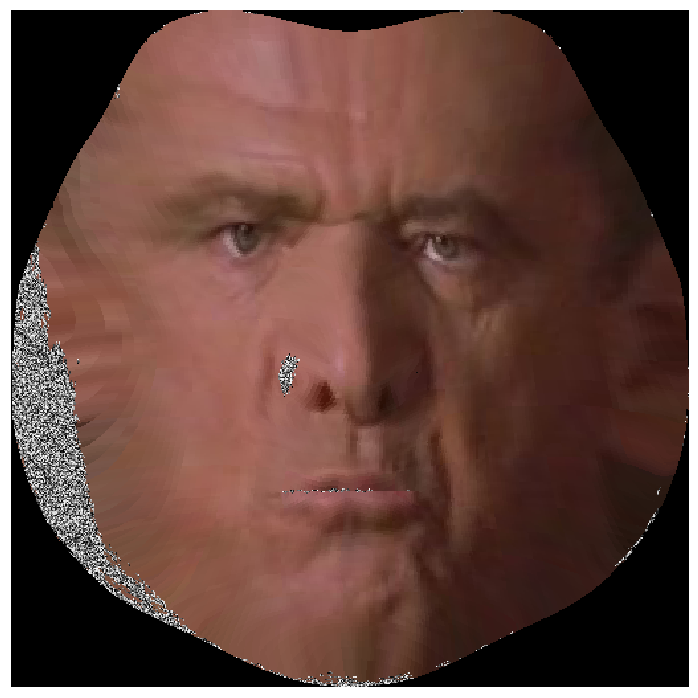

49.8400688171 62.7001818941
47.2659721375 59.4616798568
47.2659721375 59.4616798568


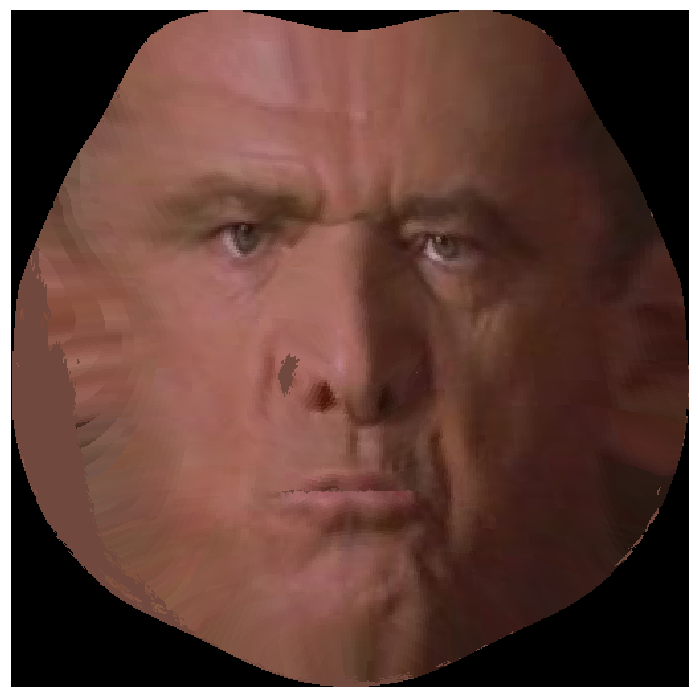

In [260]:
def preprocess_input(im, 
                     fill_input_with = 'W&B', 
                     cm_p = '/blanca/project/video-processing/resources/masks/contour_mask.png', 
                     vis=False):

    # fill missing data with noise
    n_fill_WB = cv2.randu(np.zeros(im.shape[:2]), 0, 255)
    n_fill_B = np.zeros(im.shape[:2]) * 255
    n_fill_W = np.ones(im.shape[:2]) * 255
        
    which_fill = dict(zip(['W', 'B', 'W&B'], [n_fill_W, n_fill_B, n_fill_WB]))

    mask_alpha_im = im[:,:,3] == 0
    
    for i in range(im.shape[2] - 1):
        
        if fill_input_with=='average':
            
            # read contour template mask
            im_cm = cv2.imread(cm_p)[:,:,0]
            assert im_cm is not None, 'Make sure there is a "contour_mask.png" file in this folder'
                        
            mask = im_cm == 255
            
            print(np.mean(im[:,:,0]), np.mean(im[:,:,0][mask]))
            im[:,:,i][mask_alpha_im] = (np.ones(im.shape[:2]) * np.mean(im[:,:,i][mask]))[mask_alpha_im]    
#             im[:,:,i][mask_alpha_im] = (np.ones(im.shape[:2]) * np.mean(im[:,:,i]))[mask_alpha_im]    
        
        else: im[:,:,i][mask_alpha_im] = which_fill[fill_input_with][mask_alpha_im]

    return im


# examples
imip = '/blanca/youtube_videos/output_pairs/Jack_Nicholson/4/203.isomap.png' 

im = cv2.imread(imip, cv2.IMREAD_UNCHANGED)[:,:512,:]; print(imi.shape)

plot_im(im[:,:,:3])
preprocess_input(im, fill_input_with='average')
plot_im(im[:,:,:3])

# plot_im(np.array([imi]), alpha=False)
# plot_im(np.array([imi[:,:,3]]), alpha=False) # yellow is 255; purple, 0

In [246]:
im = cv2.imread(imip, cv2.IMREAD_UNCHANGED)[:,:512,:]; print(imi.shape)

mask_alpha_im = im[:,:,3] == 0; print(mask_alpha_im.shape)
    
for i in range(im.shape[2] - 1):
        
    print(im[:,:,i].mean())
    print(im[:,:,i][mask_alpha_im].mean()) 
    
#         (np.ones(im.shape[:2]) * (im[:,:,i].mean())) [mask_alpha_im]    

(512, 512, 4)
(512, 512)
49.8400688171
127.678800857
57.894241333
127.678800857
90.4740104675
127.678800857


(512, 512, 3)
786432 786432
(512, 512, 4)


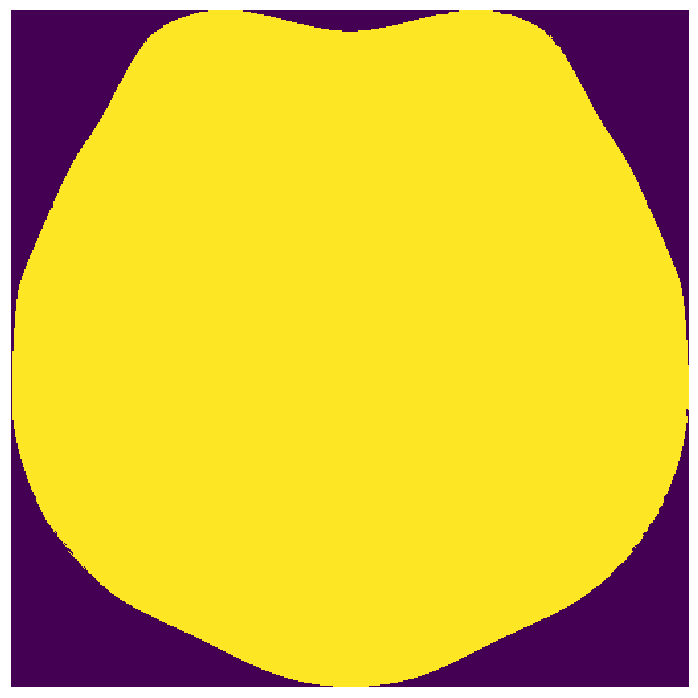

In [223]:
np.max(im_cm); print(im_cm.shape)
mask = im_cm == 255
print(im_cm.size, mask.size)

im = cv2.imread(imip, cv2.IMREAD_UNCHANGED)[:,:512,:3]; print(imi.shape)
im[:,:,1].shape
mask.shape
# plot_im(mask[:,:,0])

In [257]:
cm_p = '/blanca/project/video-processing/resources/masks/contour_mask.png'
im_cm = cv2.imread(cm_p)[:,:,0]; print(im_cm.shape)
mask = im_cm == 255
# plot_im(mask)
np.mean(im[:,:,0])
np.mean(im[:,:,0][mask])

(512, 512)


49.840068817138672

In [267]:
im = cv2.resize(im, (256, 256))
im.shape

(256, 256, 4)

In [316]:

def split_compose_blend_mirrors(im_path):

    im = cv2.imread(im_path, cv2.IMREAD_UNCHANGED)#; print(im.shape)
    imo = im[:, :im.shape[1] // 2, :]#; print(imo.shape)
    imm = im[:, im.shape[1] // 2:, :]#; print(imm.shape)


    # create masks
    imo_mask = imo[:,:,3] == 0
    imm_mask = imm[:,:,3] == 0

    imoc, immc = imo.copy(), imm.copy()
    imoc[:,:,:3][imo_mask] = imm[:,:,:3][imo_mask]
    immc[:,:,:3][imm_mask] = imo[:,:,:3][imm_mask]

    nmask = imoc[:,:,3] + immc[:,:,3]

    imocb = cv2.seamlessClone(imo[:,:,:3],
                                      immc[:,:,:3],
                                      (imo[:,:,3]).astype(np.uint8),
                                      (256, 256), cv2.NORMAL_CLONE)

    immcb = cv2.seamlessClone(imm[:,:,:3],
                                      imoc[:,:,:3],
                                      (imm[:,:,3]).astype(np.uint8),
                                      (256, 256), cv2.NORMAL_CLONE)

    imocb = np.append(imocb, np.reshape(nmask, nmask.shape + (1,)), axis=2)
    immcb = np.append(immcb, np.reshape(nmask, nmask.shape + (1,)), axis=2)
    
    return imocb, immcb

In [360]:
gpath = Path('/blanca')
ipath = gpath / 'datasets/clean-txtmap-dataset/'
opath = gpath / 'training_datasets/output_pairs'

if not os.path.exists(opath): os.makedirs(opath)

datasets = [i for i in list(ipath.glob('*')) if i.parts[-1].split('-')[-1] != 'rb' and os.path.isdir(i)]
print(datasets)

ipaths = reduce(operator.add, 
              [list(j.glob('*')) for j in datasets],
              [])

for i in ipaths:
    fname = i.parts[-2].split('_')[-1] + '_' + i.parts[-1].split('_mirror_hs.isomap.png')[0]
    imo, imm = split_compose_blend_mirrors(str(i))
    cv2.imwrite(os.path.join(opath, fname + '.png'), imo)
    cv2.imwrite(os.path.join(opath, fname + '_m.png'), imm)

[PosixPath('/blanca/datasets/clean-txtmap-dataset/txtmaps-hstack_ibug'), PosixPath('/blanca/datasets/clean-txtmap-dataset/txtmaps-hstack_300w01'), PosixPath('/blanca/datasets/clean-txtmap-dataset/txtmaps-hstack_300w02'), PosixPath('/blanca/datasets/clean-txtmap-dataset/txtmaps-hstack_helen_test'), PosixPath('/blanca/datasets/clean-txtmap-dataset/txtmaps-hstack_helen_train')]


In [ ]:
test puria function
tests scenarios
## for flipping
# imm = np.fliplr(imo)

In [372]:
def mask_image(im):
    ## SELECT AN OCCLUSSION AND APPLY TO THE IMAGE
    gpath = Path('/blanca')
    rpath = gpath / 'resources/db_occlusions'

    datasets = [rpath]
    rpaths = reduce(operator.add, 
                  [list(j.glob('*')) for j in datasets],
                  [])

#     [random.shuffle(rpaths) for i in range(int(1e4))]

    random_idx = random.sample(range(len(rpaths)), len(rpaths))

    ix = random.sample(range(len(rpaths)), 1)[0]
    imr = cv2.imread(str(rpaths[ix]), cv2.IMREAD_UNCHANGED)#; print(im.shape)
    imr = np.resize(imr, im.shape[:2])
    
    o = imr == 0

    oim = im[:,:,:3].copy() # getting rid of the original mask ?
    oim[:,:,:3][o] = 255
    oim = np.append(oim, np.reshape(imr, oim.shape[:2] + (1,)), axis=2)
    
    return oim 

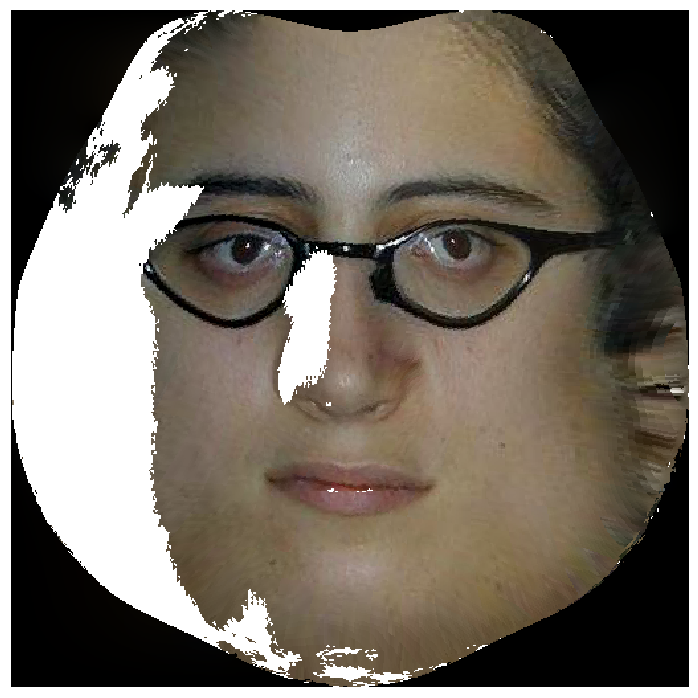

(512, 512, 4)

In [373]:
im_eg_path = '/blanca/training_datasets/output_pairs/train_1629243_1.png'
im_eg = cv2.imread(im_eg_path, cv2.IMREAD_UNCHANGED)

oim = mask_image(im_eg[:,:512,:])

plot_im(oim, alpha=True)
oim.shape

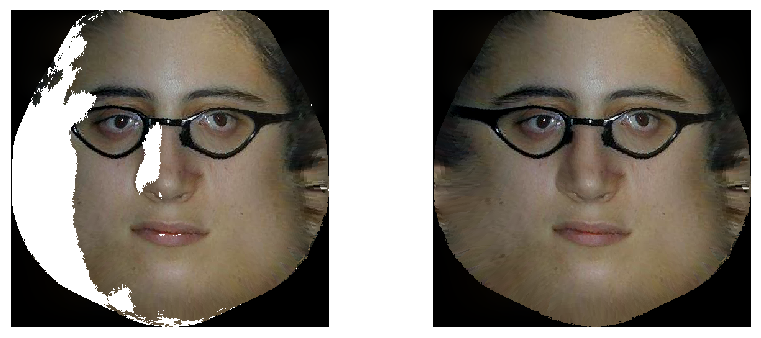

In [371]:
plot_ims(np.array([oim, im_eg[:,:512,:]]), alpha=False)

In [402]:

im_eg_path = '/blanca/training_datasets/output_pairs/300w01_indoor_005_m.png'
im_eg = cv2.imread(im_eg_path, cv2.IMREAD_UNCHANGED)

cm_p = '/blanca/project/video-processing/resources/masks/contour_mask.png'
im_cm = cv2.imread(cm_p)[:,:,0]; print(im_cm.shape)
mask = im_cm == 255; print(mask.shape)

mask_alpha_im = im_eg[:,:,3]; print(mask_alpha_im.shape)

(512, 512)
(512, 512)
(512, 512)


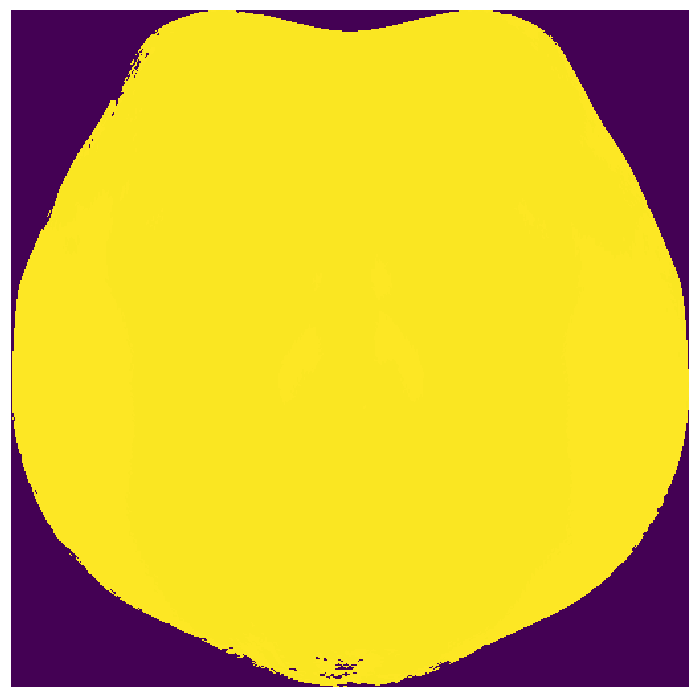

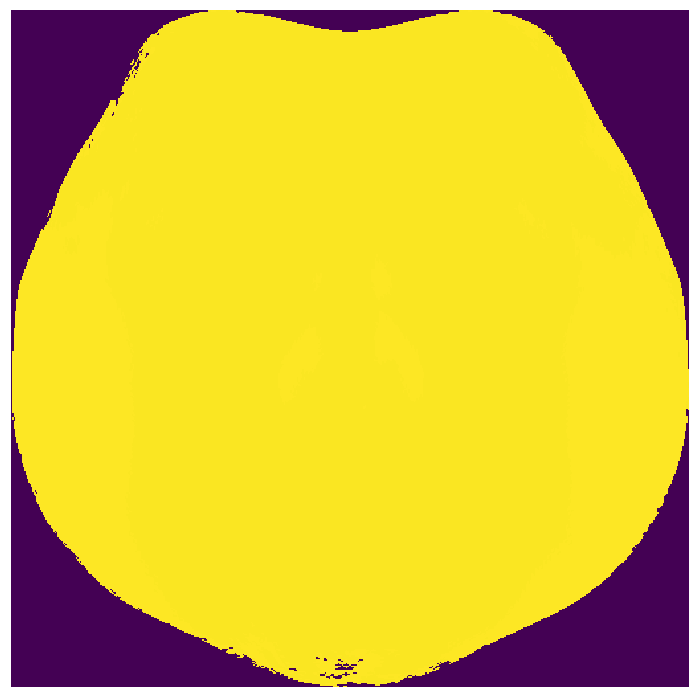

In [406]:
# im_eg[:,:,3]
plot_im(mask_alpha_im, alpha=True)
plot_im(mask_alpha_im * mask, alpha=True)

In [6]:
import sys
sys.path.append('utils')
import utils
import libraries
import utils
reload(utils)
# reload(libraries)

from utils import *
%matplotlib inline

(512, 512, 4)
(512, 512)
[0 1] [0 1]
[  0 255]


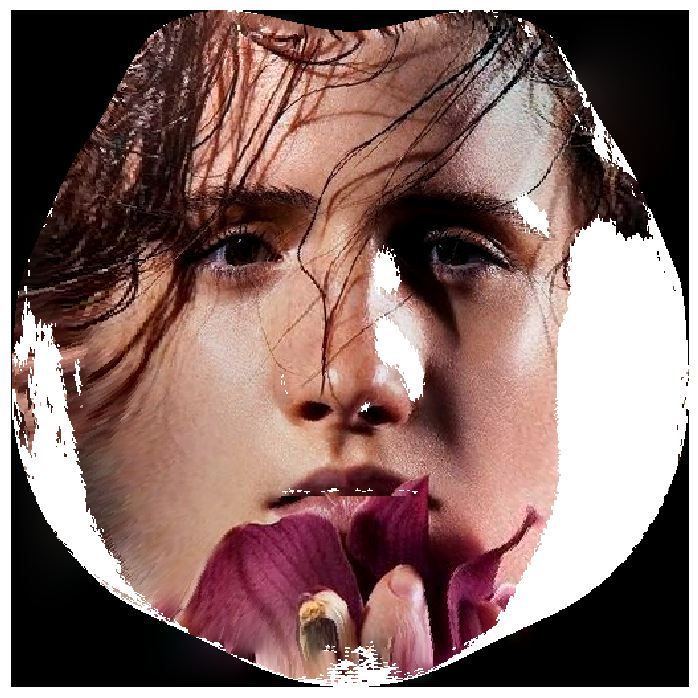

In [198]:
def fill_gaps(im, 
              fill_input_with='W&B', 
              add_artificial=False,
              only_artificial=False,
              cm_p = '/blanca/resources/contour_mask/contour_mask.png'):

    # creating fills for filling gaps
    n_fill_WB = cv2.randu(np.zeros(im.shape[:2]), 0, 255)
    n_fill_B = np.zeros(im.shape[:2]) * 255
    n_fill_W = np.ones(im.shape[:2]) * 255
        
    which_fill = dict(zip(['W', 'B', 'W&B'], [n_fill_W, n_fill_B, n_fill_WB]))

    # read contour template mask
    im_cm = cv2.imread(cm_p, cv2.IMREAD_UNCHANGED)
    assert im_cm is not None, 'Make sure there is a "contour_mask.png" file in this folder'
    mask = im_cm == 255 # contour mask: internal 
    
    new_alpha = im[:,:,3] != 0
    new_alpha[im_cm == 0] = 1 # ensuring we exclude corners what != txt. map
    im[:,:,3] = new_alpha * 255 # applying
    
    if not only_artificial:
        for i in range(im.shape[2] - 1):
            if fill_input_with=='average':
                mask_average = im[:,:,3] != 0
                print('Filling gaps with %f instead of %f' %(np.mean(im[:,:,0]), np.mean(im[:,:,0][mask_average])))
                im[:,:,i][~new_alpha] = (np.ones(im.shape[:2]) * np.mean(im[:,:,i][mask_average]))[~new_alpha]    

            else: im[:,:,i][~new_alpha] = which_fill[fill_input_with][~new_alpha]
    
    if add_artificial:
        
        ## SELECT AN OCCLUSSION AND APPLY TO THE IMAGE
        gpath = Path('/blanca')
        rpath = gpath / 'resources/db_occlusions'
        rpath = [rpath]
        rpaths = reduce(operator.add, 
                      [list(j.glob('*')) for j in rpath],
                      [])

        random_idx = random.sample(range(len(rpaths)), len(rpaths))
        ix = random.sample(range(len(rpaths)), 1)[0]
        imr = cv2.imread(str(rpaths[ix]), cv2.IMREAD_UNCHANGED); print(imr.shape)
        alpha_artifitial = imr
        alpha_artifitial[alpha_artifitial != 0] = 1
        im[:,:,3][im[:,:,3] != 0] = 1
        new_alpha_artifitial = alpha_artifitial * im[:,:,3]
        print(np.unique(im[:,:,3]), np.unique(new_alpha_artifitial))
        # setting the new alpha channel
        im[:,:,3] = new_alpha_artifitial * 255
        
        # filling
        for i in range(im.shape[2] - 1):
            im[:,:,i][~new_alpha] = which_fill[fill_input_with][~new_alpha]
    
    return im

im_eg_path = '/blanca/training_datasets/output_pairs/300w01_indoor_033.png'
im_eg = cv2.imread(im_eg_path, cv2.IMREAD_UNCHANGED); print(im_eg.shape)
# plot_im(im)

im = fill_gaps(im_eg)
print(np.unique(im[:,:,3]))
plot_im(im[:,:,:], alpha=True)

(512, 512, 4)
(512, 512)


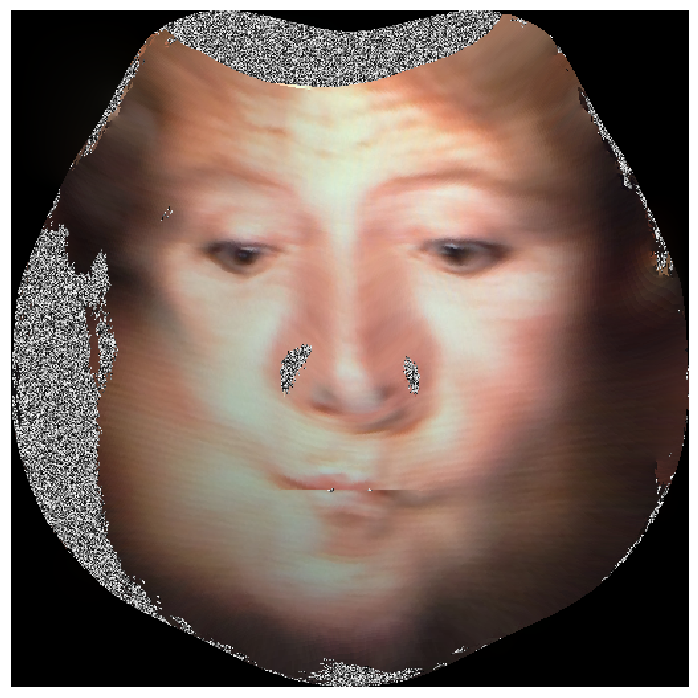

In [231]:
im_eg_path = '/blanca/training_datasets/output_pairs/300w01_indoor_115.png'
im_eg = cv2.imread(im_eg_path, cv2.IMREAD_UNCHANGED); print(im_eg.shape)
# plot_im(im_eg[:,:,:3], alpha=False)

def fill_gaps(im,
              fill_input_with='W&B', 
              add_artificial=False,
              only_artificial=False,
              cm_p = '/blanca/resources/contour_mask/contour_mask.png'):

    # creating fills for filling gaps
    n_fill_WB = cv2.randu(np.zeros(im.shape[:2]), 0, 255)
    n_fill_B = np.zeros(im.shape[:2]) * 255
    n_fill_W = np.ones(im.shape[:2]) * 255
        
    which_fill = dict(zip(['W', 'B', 'W&B'], [n_fill_W, n_fill_B, n_fill_WB]))

    # read contour template mask
    im_cm = cv2.imread(cm_p, cv2.IMREAD_UNCHANGED)
#     im_cm = read_image_OpenCV(cm_p, opt, is_pair=False)
    assert im_cm is not None, 'Make sure there is a "contour_mask.png" file in this folder'
    mask = im_cm == 255 # contour mask: internal 
    
    new_alpha = im[:,:,3] != 0
    new_alpha[im_cm == 0] = 1 # ensuring we exclude corners what != txt. map
    im[:,:,3] = new_alpha * 255 # applying
    
    if not only_artificial:
        for i in range(im.shape[2] - 1):
            if fill_input_with=='average':
                mask_average = im[:,:,3] != 0
                # print('Filling gaps with %f instead of %f' %(np.mean(im[:,:,0]), np.mean(im[:,:,0][mask_average])))
                im[:,:,i][~new_alpha] = (np.ones(im.shape[:2]) * np.mean(im[:,:,i][mask_average]))[~new_alpha]    
            else: im[:,:,i][~new_alpha] = which_fill[fill_input_with][~new_alpha]
    
    if add_artificial:
        ## SELECT AN OCCLUSSION AND APPLY TO THE IMAGE
        gpath = Path('/blanca')
        rpath = gpath / 'resources/db_occlusions'
        rpath = [rpath]
        rpaths = reduce(operator.add, 
                      [list(j.glob('*')) for j in rpath],
                      [])
        
#         reandom.seed()
        random_idx = random.sample(range(len(rpaths)), len(rpaths))
        ix = random.sample(range(len(rpaths)), 1)[0]
#         imr = read_image_OpenCV(str(rpaths[ix]), opt, is_pair=False)
        imr = cv2.imread(str(rpaths[ix]), cv2.IMREAD_UNCHANGED); print(imr.shape)
        alpha_artifitial = imr
        alpha_artifitial[alpha_artifitial != 0] = 1
        im[:,:,3][im[:,:,3] != 0] = 1
        new_alpha_artifitial = alpha_artifitial * im[:,:,3]
        # setting the new alpha channel
        im[:,:,3] = new_alpha_artifitial * 255
        
        # filling
        for i in range(im.shape[2] - 1):
            im[:,:,i][new_alpha_artifitial == 0] = which_fill[fill_input_with][new_alpha_artifitial == 0]
    
    return im

out = fill_gaps(im_eg, add_artificial=True)
plot_im(out, alpha=False)

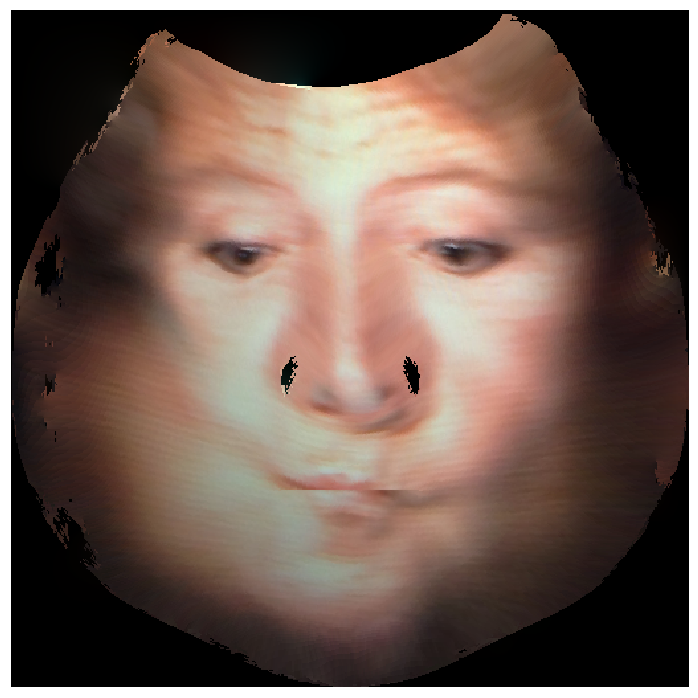

(512, 512)


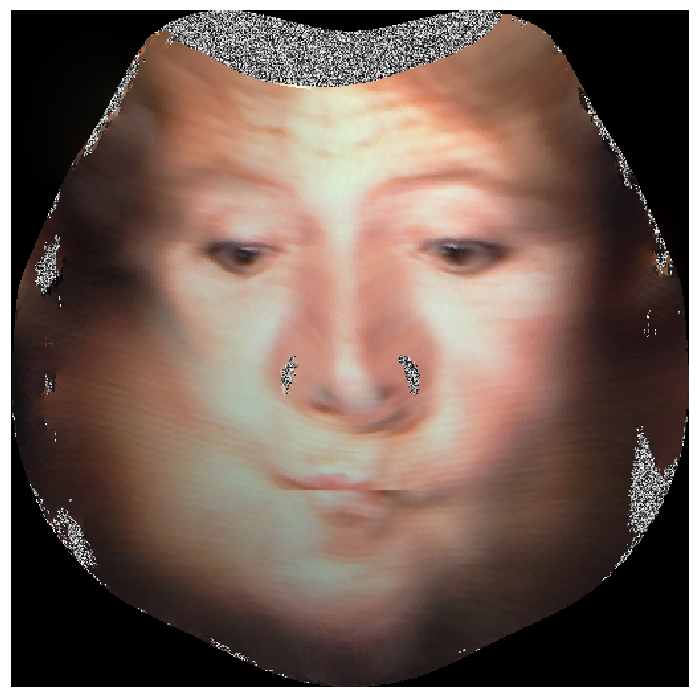

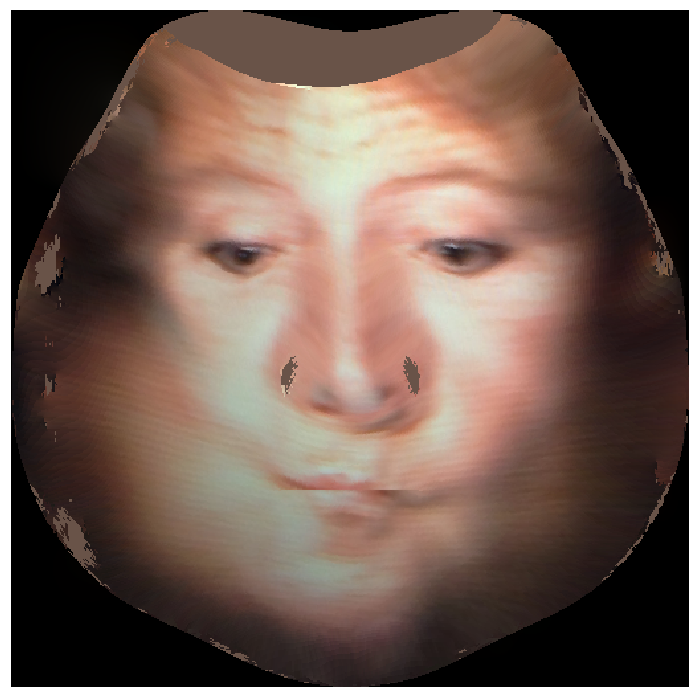

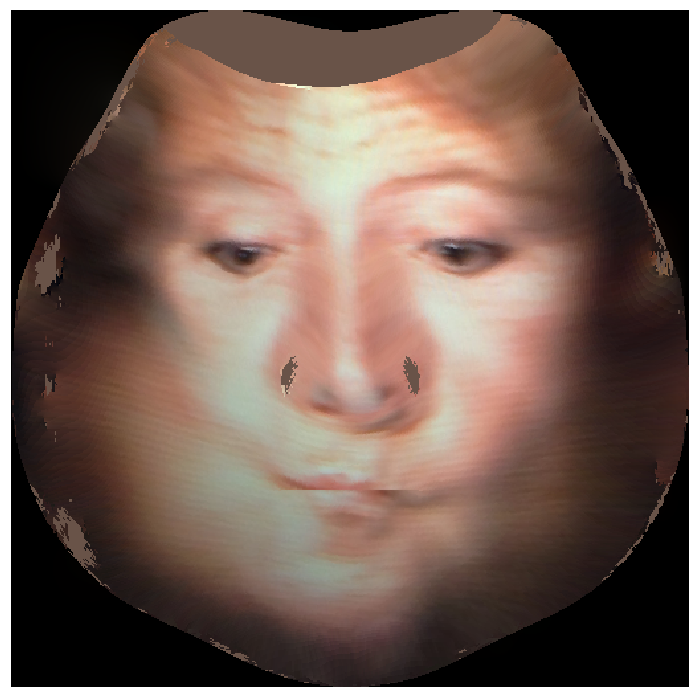

In [241]:
def fill_gaps(im,
              fill_input_with='W&B', 
              add_artificial=False,
              only_artificial=False,
              cm_p = '/blanca/resources/contour_mask/contour_mask.png'):
    

    # creating fills for filling gaps
    n_fill_WB = cv2.randu(np.zeros(im.shape[:2]), 0, 255)
    n_fill_B = np.zeros(im.shape[:2]) * 255
    n_fill_W = np.ones(im.shape[:2]) * 255
        
    which_fill = dict(zip(['W', 'B', 'W&B'], [n_fill_W, n_fill_B, n_fill_WB]))

    # read contour template mask
    im_cm = cv2.imread(cm_p, cv2.IMREAD_UNCHANGED)
#     im_cm = read_image_OpenCV(cm_p, opt, is_pair=False)
    assert im_cm is not None, 'Make sure there is a "contour_mask.png" file in this folder'
    mask = im_cm == 255 # contour mask: internal 
    
    new_alpha = im[:,:,3] != 0
    new_alpha[im_cm == 0] = 1 # ensuring we exclude corners what != txt. map
    im[:,:,3] = new_alpha * 255 # applying
    
    if not only_artificial:
        for i in range(im.shape[2] - 1):
            if fill_input_with=='average':
                mask_average = im[:,:,3] != 0
                # print('Filling gaps with %f instead of %f' %(np.mean(im[:,:,0]), np.mean(im[:,:,0][mask_average])))
                im[:,:,i][~new_alpha] = (np.ones(im.shape[:2]) * np.mean(im[:,:,i][mask_average]))[~new_alpha]    
            else: im[:,:,i][~new_alpha] = which_fill[fill_input_with][~new_alpha]
    
    if add_artificial:
        ## SELECT AN OCCLUSSION AND APPLY TO THE IMAGE
        gpath = Path('/blanca')
        rpath = gpath / 'resources/db_occlusions'
        rpath = [rpath]
        rpaths = reduce(operator.add, 
                      [list(j.glob('*')) for j in rpath],
                      [])
        
#         reandom.seed()
        random_idx = random.sample(range(len(rpaths)), len(rpaths))
        ix = random.sample(range(len(rpaths)), 1)[0]
#         imr = read_image_OpenCV(str(rpaths[ix]), opt, is_pair=False); print(imr.shape)
        imr = cv2.imread(str(rpaths[ix]), cv2.IMREAD_UNCHANGED); print(imr.shape)
        alpha_artifitial = imr
        alpha_artifitial[alpha_artifitial != 0] = 1
        im[:,:,3][im[:,:,3] != 0] = 1
        new_alpha_artifitial = alpha_artifitial * im[:,:,3]
        # setting the new alpha channel
        im[:,:,3] = new_alpha_artifitial * 255
        
        # filling
        for i in range(im.shape[2] - 1):
            im[:,:,i][new_alpha_artifitial == 0] = which_fill[fill_input_with][new_alpha_artifitial == 0]
    
    return im

im_eg_path = '/blanca/training_datasets/output_pairs/300w01_indoor_115.png'
im_eg = cv2.imread(im_eg_path, cv2.IMREAD_UNCHANGED)
plot_im(im_eg, alpha=False)

out = fill_gaps(im_eg.copy(), add_artificial=True)
plot_im(out, alpha=False)

out_la = fill_gaps(im_eg, fill_input_with='average')
plot_im(out_la, alpha=False)
plot_im(im_eg, alpha=False)

In [2]:
import sys
sys.path.append('utils')
import libraries
from utils import *

%matplotlib inline

In [3]:
path = Path('/blanca/training_datasets/output_pairs_clean')
ims = list(path.glob('*.png'))

cm_path = '/blanca/project/video-processing/resources/masks/contour_mask.png'
mask = cv2.imread(cm_path)
mask_bool = mask[:,:,0] != 0

# OPENCV BGR (ALPHABETIC ORDER)
B_ml, G_ml, R_ml = [], [], []
for i in ims:
    im = cv2.imread(str(i))
    B_ml.append(np.mean(im[:,:,0][mask_bool]))
    G_ml.append(np.mean(im[:,:,1][mask_bool]))
    R_ml.append(np.mean(im[:,:,2][mask_bool]))
    print('Average values for image %s: B %f | G %f | R %f' %(i, B_ml[-1], G_ml[-1], R_ml[-1]))
    
print(len(B_ml), len(G_ml), len(R_ml))

0 0 0


In [4]:
for i in [B_ml, G_ml, R_ml]:
    print(sum(i)/float(len(i)))
    
# plot distributions
IMAGENET:     [103.939, 116.779, 123.68]
TRAINING_SET: [89.82, 105.22, 138.71]

ZeroDivisionError: float division by zero

Total images found: 36


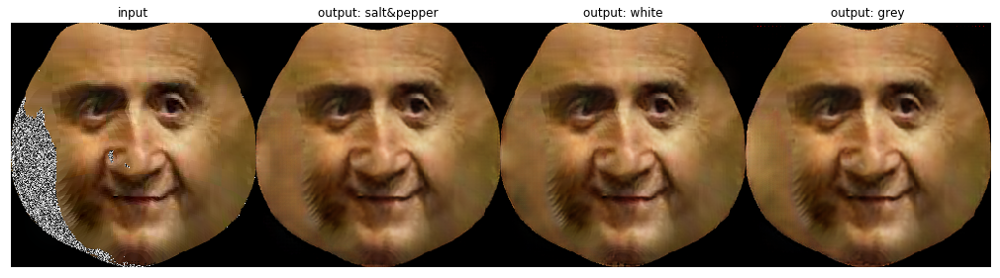

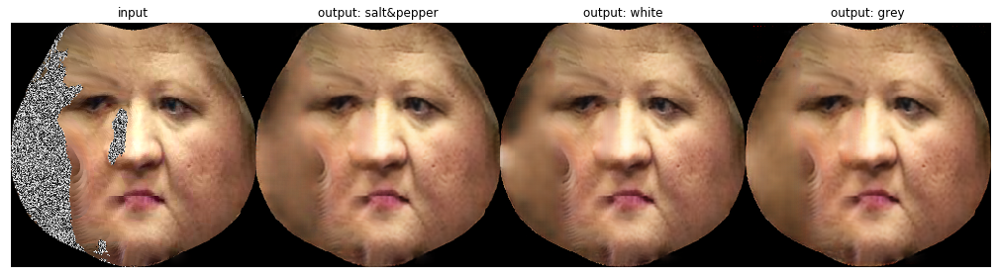

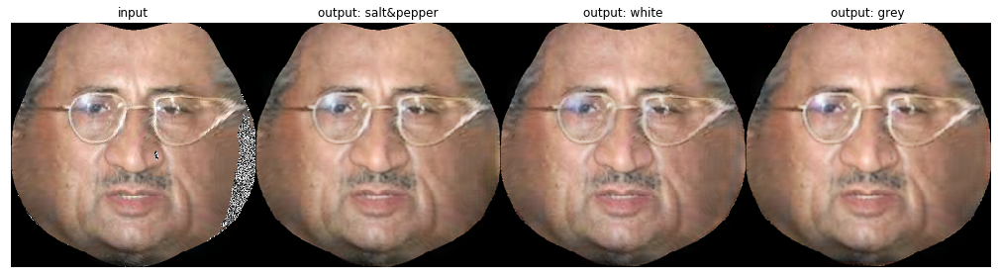

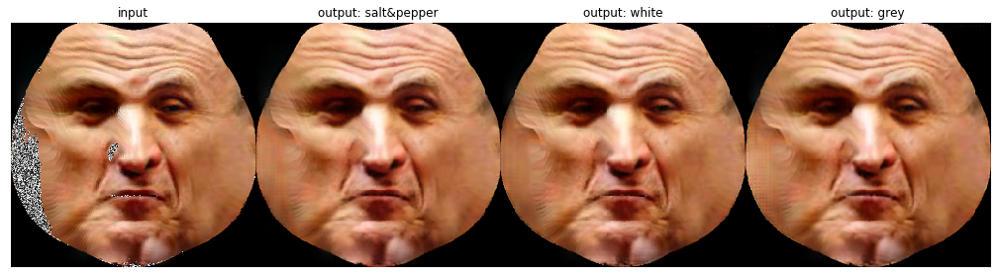

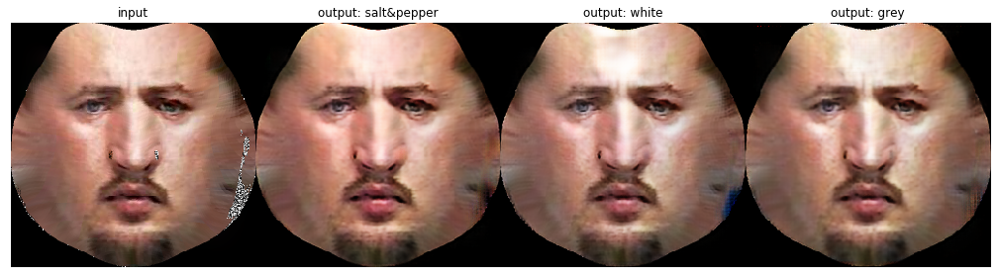

...

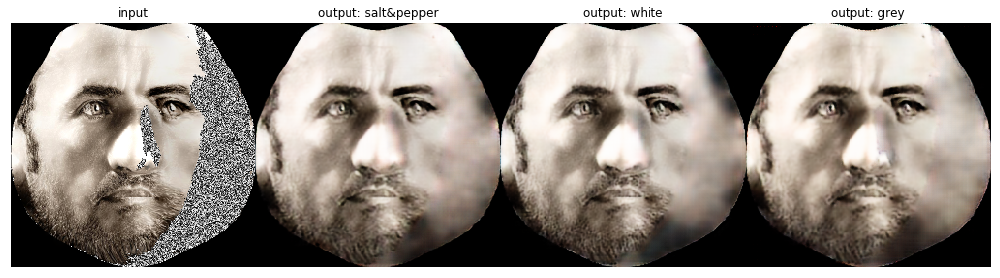

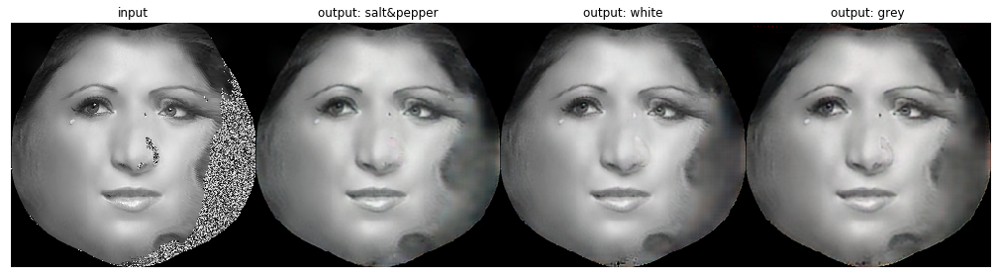

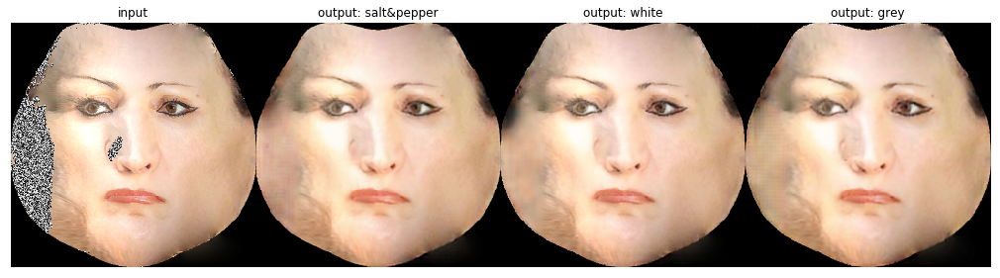

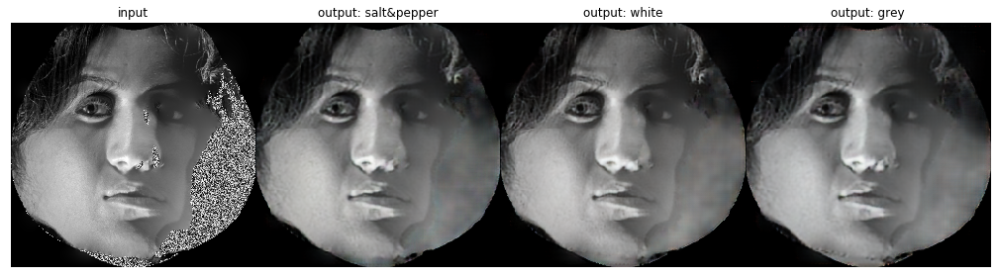

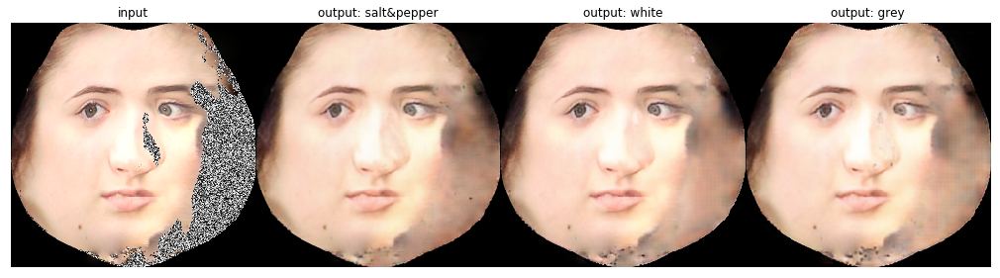

In [312]:


# create subplot
def plot_ims(data, alpha=True, cmap=None, titles=None): # plot_images(12)
    """
    Expects numpy array with channels last
    """
    nrows = 1
#     print('Here', len(data.shape[1:]), data.shape[1:])
    if len(data.shape[:1]) == 3: ncols = 1
    else: ncols = data.shape[0] // nrows
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols)
    fig.set_size_inches(14, 5)
    fig.tight_layout()
    for i, ax in enumerate(axes.flat):
        if len(data[i].shape) == 2: im = ax.imshow(data[i], cmap=cmap)
        elif (data[i].shape[2] == 4):
            if alpha: im = ax.imshow(data[i][:,:,[2,1,0,3]], cmap=cmap)
            else: im = ax.imshow(data[i][:,:,[2,1,0]], cmap=cmap)
        elif (data[i].shape[2] == 3): im = ax.imshow(data[i][:,:,[2,1,0]], cmap=cmap)
        else: print('Data dimensions not supported')
        ax.set_axis_off()
        if titles: 
            ti= titles[i]
            ax.set_title(ti)
        else: ax.title.set_visible(False)
        ax.xaxis.set_ticks([])
        ax.yaxis.set_ticks([])
        for spine in ax.spines.values():
            spine.set_visible(False)
    plt.subplots_adjust(left=0, hspace=0, wspace=0)
    plt.show()
    

ims_p = glob('/blanca/project/wip/pytorch-CycleGAN-and-pix2pix/results/helen_clean2/test_latest/images/*.png')
print('Total images found:', len(ims_p))
    
test_fs = ['helen_clean2', 'helen_clean2_W', 'helen_clean2_G']

titles = ['input', 'output: salt&pepper', 'output: white', 'output: grey']

for i in ims_p:
    if_name = i.split('/')[-1]

    if if_name.split('_')[2] == 'real':
        input_im = cv2.imread(i)
        row_ims = [input_im]
        of_name = if_name.split('_')[0] + '_cb_fake_B.png'
        
        for f in test_fs:
            f = Path(f)
            im_path = '/blanca/project/wip/pytorch-CycleGAN-and-pix2pix/results' / f / 'test_latest/images' / of_name
            row_ims.append(cv2.imread(str(im_path)))
        
        plot_ims(np.array(row_ims), titles=titles)

In [432]:

path3 = '/blanca/training_datasets/p2p/output_pairs_clean_class_B'
if not os.path.exists(path3): os.makedirs(path3)

path1 = Path('/blanca/training_datasets/p2p/output_pairs_clean_class_G')
path2 = Path('/blanca/training_datasets/p2p/output_pairs_clean')

pl1 = list(path1.glob('*')); print(len(pl1))
pl2 = list(path2.glob('*')); print(len(pl2))

fl1 = [i.parts[-1] for i in pl1]; print(len(fl1))
fl2 = [i.parts[-1] for i in pl2]; print(len(fl2))


# fl2 = 

for i in pl2:
    if i.parts[-1] not in fl1:
        os.system('cp %s %s' %(i, path3))

1292
2224
1292
2224


In [428]:
pl1[0].parts

('/',
 'blanca',
 'training_datasets',
 'p2p',
 'output_pairs_clean_class_G',
 'ibug_image_094.png')

In [437]:
path = '/blanca/training_datasets/p2p/output_pairs_clean_class/bad_fit/300w01_indoor_004_m.png'
im = cv2.imread(path, cv2.IMREAD_UNCHANGED)
print(im.shape)
im = cv2.resize(im, (224, 224))
print(im.shape)

(512, 512, 4)
(224, 224, 4)


In [13]:
import sys
sys.path.append('utils')
import libraries
from utils import *

%matplotlib inline

In [14]:
path = '/blanca/training_datasets/p2p/output_pairs_clean'
path = Path(path)
ims_path_list = path.glob('*_m.png')
pairs_path_list = []
for i in ims_path_list:
    pair_name = i.parts[-1].split('_m.png')[0] + '.png'
    pair_path = path.glob(pair_name)
    pair_path = str(list(pair_path)[0])
    pair_path_mirror = str(i)
    pairs_path_list.append([pair_path, pair_path_mirror])
    
random.seed(1984)
[random.shuffle(pairs_path_list) for i in range(int(1e4))]
print(len(pairs_path_list))

1112


In [46]:
### Copyright (C) 2017 NVIDIA Corporation. All rights reserved. 
### Licensed under the CC BY-NC-SA 4.0 license (https://creativecommons.org/licenses/by-nc-sa/4.0/legalcode).
import os.path
# from data.base_dataset import BaseDataset, get_params, get_transform, normalize, fill_gaps, read_image_OpenCV
# from data.image_folder import make_dataset
import torchvision.transforms as transforms
import torch.utils.data as data

import numpy as np
import random
from pathlib import Path
from functools import reduce
import operator
import cv2
from PIL import Image

def read_image_PIL(path, opt):
        im = Image.open(path).convert('RGB')
        im = im.resize((opt.loadSize * 2, opt.loadSize), Image.BICUBIC)
        return im

def read_image_OpenCV(path, opt, is_pair=False):
        im = cv2.imread(path, cv2.IMREAD_UNCHANGED)
        if is_pair: im = cv2.resize(im, (opt.loadSize * 2, opt.loadSize))
        else: im = cv2.resize(im, (opt.loadSize, opt.loadSize))
        return im

# def reduce_and_shuffle_dict_values_nested1level(d):
#
#     flat = reduce(operator.add,
#                       [reduce(operator.add, i.values(), []) for i in list(d.values())],
#                       [])
#
#     [random.shuffle(flat) for i in range(int(1e4))]
#
#     return flat

# def create_dataset_from_dir2subdir(dir, nitems=None):
#
#     """
#     Create a list of paths from a nesteed dir with two levels, selecting nitems from each dir of the last level
#     """
#
#     EXT_RECURSIVE = ['**/*.jpg', '**/*.JPG', '**/*.png', '**/*.ppm']
#     from collections import OrderedDict
#
#     path = Path(dir)
#     id_names = [i.parts[-1] for i in list(path.glob('*')) if os.path.isdir(i)]
#
#     n_items_per_last_level = nitems
#
#     data_dict = OrderedDict({i: {} for i in sorted(id_names)})
#     data_dict_nitems = OrderedDict({i: {} for i in sorted(id_names)})
#
#     # INITIALISE
#     for i in id_names:
#         for j in os.listdir(path/i):
#             data_dict[i][j] = None
#
#     # FILLING
#     import random
#     random.seed()
#
#     for i in data_dict.keys():
#         for j in data_dict[i].keys():
#             txt_pl = reduce(
#                   operator.add,
#                   [list((path/i/j).glob('**/*.isomap.png'))],
#                   [])
#
#             # DICT WITH ALL PATHS
#             data_dict[i][j] = txt_pl
#
#             # DICT WITH MAX(N) PATHS
#             random_idx = random.sample(range(len(txt_pl)), min(len(txt_pl), n_items_per_last_level))
#             txt_pl_nitems = [str(txt_pl[i]) for i in random_idx]
#
#             data_dict_nitems[i][j] = txt_pl_nitems
#
#     print('Total found IDs in path %s: %d' %(path, len(data_dict_nitems)), '.. and selected %d per ID' %n_items_per_last_level)
#
#     data_list_n_shuffled = reduce_and_shuffle_dict_values_nested1level(data_dict_nitems)
#
#     return data_list_n_shuffled
#
# def make_dataset_fromIDsubfolders(dir, nitems=None):
#     assert os.path.isdir(dir), '%s is not a valid directory' % dir
#     images = create_dataset_from_dir2subdir(dir, nitems)
#     return images

def fill_gaps(im, opt,
              fill_input_with=None,
              add_artificial=False,
              only_artificial=False,
              cm_p = '/blanca/resources/contour_mask/contour_mask.png'):
    
    if not fill_input_with: fill_input_with = opt.fill
    
    # creating fills for filling gaps
    n_fill_WB = cv2.randu(np.zeros(im.shape[:2]), 0, 255)
    n_fill_B = np.zeros(im.shape[:2]) * 255
    n_fill_W = np.ones(im.shape[:2]) * 255
    n_fill_G = np.ones(im.shape[:2]) * 127
    
    which_fill = dict(zip(['W', 'B', 'W&B', 'G'], [n_fill_W, n_fill_B, n_fill_WB, n_fill_G]))

    # read contour template mask
    # im_cm = cv2.imread(cm_p, cv2.IMREAD_UNCHANGED)
    im_cm = read_image_OpenCV(cm_p, opt, is_pair=False)
    assert im_cm is not None, 'Make sure there is a "contour_mask.png" file in this folder'
    mask = im_cm == 255 # contour mask: internal 
    
    new_alpha = im[:,:,3] != 0
    new_alpha[im_cm == 0] = 1 # ensuring we exclude corners what != txt. map
    im[:,:,3] = new_alpha * 255 # applying
    
    if not only_artificial:
        for i in range(im.shape[2] - 1):
            if fill_input_with=='average':
                mask_average = im[:,:,3] != 0
                # print('Filling gaps with %f instead of %f' %(np.mean(im[:,:,0]), np.mean(im[:,:,0][mask_average])))
                im[:,:,i][~new_alpha] = (np.ones(im.shape[:2]) * np.mean(im[:,:,i][mask_average]))[~new_alpha]    
            else: im[:,:,i][~new_alpha] = which_fill[fill_input_with][~new_alpha]
    
    if add_artificial and opt.phase != 'test':
        ## SELECT AN OCCLUSSION AND APPLY TO THE IMAGE
        gpath = Path('/blanca')
        rpath = gpath / 'resources/db_occlusions'
        rpath = [rpath]
        rpaths = reduce(operator.add, 
                      [list(j.glob('*')) for j in rpath],
                      [])
        
        random_idx = random.sample(range(len(rpaths)), len(rpaths))
        ix = random.sample(range(len(rpaths)), 1)[0]
        # if opt.phase == 'test':
        #         rpath_test = '/blanca/resources/db_oclusions_test/000220_39.png'
        #         imr = read_image_OpenCV(rpath_test, opt, is_pair=False)
        # else:
        imr = read_image_OpenCV(str(rpaths[ix]), opt, is_pair=False)
        # imr = cv2.imread(str(rpaths[ix]), cv2.IMREAD_UNCHANGED)
        alpha_artifitial = imr
        alpha_artifitial[alpha_artifitial != 0] = 1
        im[:,:,3][im[:,:,3] != 0] = 1
        new_alpha_artifitial = alpha_artifitial * im[:,:,3]
        # setting the new alpha channel
        im[:,:,3] = new_alpha_artifitial * 255
        
        # filling
        for i in range(im.shape[2] - 1):
            im[:,:,i][new_alpha_artifitial == 0] = which_fill[fill_input_with][new_alpha_artifitial == 0]
    
    return im


def create_dataset(path = '/blanca/training_datasets/p2p/output_pairs_clean'):
        path = Path(path)
        ims_path_list = path.glob('*_m.png')
        pairs_path_list = []
        for i in ims_path_list:
                pair_name = i.parts[-1].split('_m.png')[0] + '.png'
                pair_path = path.glob(pair_name)
                pair_path = str(list(pair_path)[0])
                pair_path_mirror = str(i)
                pairs_path_list.append([pair_path, pair_path_mirror])

                random.seed(1984)
                [random.shuffle(pairs_path_list) for i in range(int(1e2))]
        return pairs_path_list


def apply_data_transforms(im, which, opt, nchannels):
        
    transform_list = []
    if which == 'target':
        transform_list += [
                transforms.Lambda(lambda x: fill_gaps(x, opt, fill_input_with='average')),
                transforms.Lambda(lambda x: x[:, :, :nchannels]),
                transforms.ToTensor(),
                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                ]
    else:        
        transform_list += [
            transforms.Lambda(lambda x: x.copy()),
            transforms.Lambda(lambda x: fill_gaps(x, opt, add_artificial=True)),
            transforms.Lambda(lambda x: x[:, :, :nchannels]),
            transforms.ToTensor(),
            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    ]                                    
                                         
    return transforms.Compose(transform_list)(im)
    
    
class BaseDataset(data.Dataset):
    def __init__(self):
        super(BaseDataset, self).__init__()

    def name(self):
        return 'BaseDataset'

    def initialize(self, opt):
        pass

class AlignedDataset(BaseDataset):
    def initialize(self, opt):
        self.opt = opt
        self.root = opt.dataroot    
        self.target_paths = create_dataset(self.root)
        self.dataset_size = len(self.target_paths) 
      
    def __getitem__(self, index):                              
        
        inst_tensor = feat_tensor = 0
        
        input_nc = self.opt.label_nc if self.opt.label_nc != 0 else 3
        output_nc = self.opt.output_nc
        
        # read target image
        target_path = self.target_paths[index][0]
        target_path_mirror = self.target_paths[index][1]
        
        target_im = read_image_OpenCV(target_path, self.opt)
        target_im_mirror = read_image_OpenCV(target_path_mirror, self.opt)
        
        # create input tensor first
        if self.opt.isTrain:
            input_tensor = apply_data_transforms(target_im, 'input', self.opt, input_nc)
            input_tensor_mirror = apply_data_transforms(target_im_mirror, 'input', self.opt, input_nc)
        
        # create output tensor
        target_tensor = apply_data_transforms(target_im, 'target', self.opt, output_nc)
        target_tensor_mirror = apply_data_transforms(target_im_mirror, 'target', self.opt, output_nc)
         
        input_dict = {'label': [input_tensor, input_mirror_tensor], 'inst': inst_tensor, 
                      'image': [target_tensor, target_tensor_mirror],
                      'feat': feat_tensor, 'path': [target_path, target_path_mirror]}

        return input_dict

    def __len__(self):
        return len(self.target_paths)

    def name(self):
        return 'AlignedDataset'
    
import torch.utils.data

def CreateDataset(opt):
    dataset = None
#     from data.aligned_dataset_custom import AlignedDataset
    dataset = AlignedDataset()
    print("dataset [%s] was created" % (dataset.name()))
    dataset.initialize(opt)
    return dataset

class BaseDataLoader():
    def __init__(self):
        pass
    
    def initialize(self, opt):
        self.opt = opt
        pass

    def load_data():
        return None

class CustomDatasetDataLoader(BaseDataLoader):
    def name(self):
        return 'CustomDatasetDataLoader'

    def initialize(self, opt):
        BaseDataLoader.initialize(self, opt)
        self.dataset = CreateDataset(opt)
        self.dataloader = torch.utils.data.DataLoader(
            self.dataset,
            batch_size=opt.batchSize,
            shuffle=not opt.serial_batches,
            num_workers=int(opt.nThreads))

    def load_data(self):
        return self.dataloader

    def __len__(self):
        return min(len(self.dataset), self.opt.max_dataset_size)
    
def CreateDataLoader(opt):
#     from data.custom_dataset_data_loader import CustomDatasetDataLoader
    data_loader = CustomDatasetDataLoader()
    print(data_loader.name())
    data_loader.initialize(opt)
    return data_loader

class Opt:
    def __init__(self, path):
        self.dataroot = path
        self.batchSize = 16
        self.serial_batches = False
        self.nThreads = 1
        self.label_nc, self.output_nc = 3, 3
        self.loadSize = 256
        self.isTrain = True
        self.fill = 'W&B',
        self.phase = 'train'

In [47]:
path = '/blanca/training_datasets/p2p/output_pairs_clean'
opt = Opt(path)
data_loader = CreateDataLoader(opt)
dataset = data_loader.load_data()

CustomDatasetDataLoader
dataset [AlignedDataset] was created


In [94]:
###
i_p1 = '/blanca/training_datasets/pix2pix/images_target/'
i_p2 = '/blanca/training_datasets/pix2pix/images_target_clean/'
o_p = '/blanca/training_datasets/pix2pix/test_images_target/'

i_p1l = [i.split(i_p1)[-1] for i in glob(os.path.join(i_p1, '*.png'))]; print(len(i_p1l))
i_p2l = [i.split(i_p2)[-1] for i in glob(os.path.join(i_p2, '*.png'))]; print(len(i_p2l))

# intersection
np_l = [i for i in i_p1l if i not in i_p2l]; print(len(np_l))

for i in np_l:
    f_i_p = os.path.join(i_p1, i); print(f_i_p, o_p)
#     os.system('cp %s %s' %(f_i_p, o_p))
print('Total not-complete images: %s' %len(glob(os.path.join(o_p, '*.png'))))

3774
2224
1550
/blanca/training_datasets/pix2pix/images_target/ibug_image_013.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/ibug_image_013_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/ibug_image_070.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/ibug_image_070_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/ibug_image_104.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/ibug_image_104_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/ibug_image_036.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/ibug_image_036_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/t

/blanca/training_datasets/pix2pix/images_target/300w01_indoor_118.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/300w01_indoor_118_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/300w01_indoor_131.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/300w01_indoor_131_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/300w01_indoor_216.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/300w01_indoor_216_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/300w01_indoor_253.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/300w01_indoor_253_m.png /blanca/training_datasets/pix2pix/test_images_target/


/blanca/training_datasets/pix2pix/images_target/300w02_outdoor_173.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/300w02_outdoor_173_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/300w02_outdoor_235.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/300w02_outdoor_235_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/300w02_outdoor_263.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/300w02_outdoor_263_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/300w02_outdoor_289.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/300w02_outdoor_289_m.png /blanca/training_datasets/pix2pix/test_images_

/blanca/training_datasets/pix2pix/images_target/test_3241092906_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/test_3241092906_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/test_3053981414_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/test_3053981414_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/test_3214010220_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/test_3214010220_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/test_3138240967_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/test_3138240967_1_m.png /blanca/training_datasets/pix2pix/test_images_target/


/blanca/training_datasets/pix2pix/images_target/test_305917477_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/test_3248183827_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/test_3248183827_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/test_3052055699_2.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/test_3052055699_2_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/test_3226773050_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/test_3226773050_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/test_2983130985_1.png /blanca/training_datasets/pix2pix/test_images_target/
/

/blanca/training_datasets/pix2pix/images_target/test_2983659920_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/test_2983659920_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/test_2984431316_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/test_2984431316_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/test_3039925276_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/test_3039925276_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/test_2968560214_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/test_2968560214_1_m.png /blanca/training_datasets/pix2pix/test_images_target/


/blanca/training_datasets/pix2pix/images_target/train_2228100915_3_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2738554611_2.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2738554611_2_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2864812753_2.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2864812753_2_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2332408096_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2332408096_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_1411496009_1.png /blanca/training_datasets/pix2pix/test_images_

/blanca/training_datasets/pix2pix/images_target/train_2402251921_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2719467991_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2719467991_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_291541184_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_291541184_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_12799337_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_12799337_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2330128831_1.png /blanca/training_datasets/pix2pix/test_images_target

/blanca/training_datasets/pix2pix/images_target/train_2397581549_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2397581549_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2330129413_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2330129413_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2139669544_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2139669544_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_1887411993_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_1887411993_1_m.png /blanca/training_datasets/pix2pix/test_images_

/blanca/training_datasets/pix2pix/images_target/train_2719464221_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_155393981_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_155393981_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_205848147_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_205848147_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_206906451_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_206906451_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2563042318_1.png /blanca/training_datasets/pix2pix/test_images_target

/blanca/training_datasets/pix2pix/images_target/train_121204156_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2553305023_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2553305023_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2671732783_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2671732783_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_13601448_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_13601448_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_276753589_1.png /blanca/training_datasets/pix2pix/test_images_target

/blanca/training_datasets/pix2pix/images_target/train_2430664591_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2366695522_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2366695522_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2656257353_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2656257353_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2863358045_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2863358045_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2231468853_1.png /blanca/training_datasets/pix2pix/test_images_

/blanca/training_datasets/pix2pix/images_target/train_2634866872_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2634866872_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2483653127_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2483653127_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2070105355_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2070105355_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2340986522_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2340986522_1_m.png /blanca/training_datasets/pix2pix/test_images_

/blanca/training_datasets/pix2pix/images_target/train_169346774_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_169346774_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2938393693_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2938393693_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2169601621_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2169601621_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2091167603_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2091167603_1_m.png /blanca/training_datasets/pix2pix/test_images_ta

/blanca/training_datasets/pix2pix/images_target/train_1021890651_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_15024375_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_15024375_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2397601939_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2397601939_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2098713580_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2098713580_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2512750679_1.png /blanca/training_datasets/pix2pix/test_images_targ

/blanca/training_datasets/pix2pix/images_target/train_1018882799_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_1018882799_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2472784229_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2472784229_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2289874177_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2289874177_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2943363160_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2943363160_1_m.png /blanca/training_datasets/pix2pix/test_images_

/blanca/training_datasets/pix2pix/images_target/train_2741148975_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2861948045_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2861948045_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_1425648903_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_1425648903_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2405801774_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2405801774_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2534934254_1.png /blanca/training_datasets/pix2pix/test_images_

/blanca/training_datasets/pix2pix/images_target/train_218904413_2.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_218904413_2_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_106348540_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_106348540_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_1402640447_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_1402640447_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2189567066_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2189567066_1_m.png /blanca/training_datasets/pix2pix/test_images_targ

/blanca/training_datasets/pix2pix/images_target/train_2216370944_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2216370944_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_294910698_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_294910698_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2400986257_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2400986257_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_245871800_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_245871800_1_m.png /blanca/training_datasets/pix2pix/test_images_targ

/blanca/training_datasets/pix2pix/images_target/train_1434217156_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_1434217156_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2871609349_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2871609349_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2398725148_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2398725148_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2877095014_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2877095014_1_m.png /blanca/training_datasets/pix2pix/test_images_

/blanca/training_datasets/pix2pix/images_target/train_2849854366_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2849854366_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2761106136_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2761106136_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2138681738_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2138681738_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2442576256_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2442576256_1_m.png /blanca/training_datasets/pix2pix/test_images_

/blanca/training_datasets/pix2pix/images_target/train_1242475639_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2858826857_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2858826857_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_1504594019_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_1504594019_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_167671301_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_167671301_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_106326063_1.png /blanca/training_datasets/pix2pix/test_images_tar

/blanca/training_datasets/pix2pix/images_target/train_2091094311_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_155093594_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_155093594_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2593505397_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2593505397_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_280469983_1.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_280469983_1_m.png /blanca/training_datasets/pix2pix/test_images_target/
/blanca/training_datasets/pix2pix/images_target/train_2150058510_1.png /blanca/training_datasets/pix2pix/test_images_targ

TypeError: not all arguments converted during string formatting

In [159]:
def create_dataset_withLabel(path, classes=['bad_fit', 'good_fit'], return_pairs=None):
        path = Path(path)
        class_paths = [i for i in path.glob('*') if os.path.isdir(i)]

        pairs_path_list = []
        for i in class_paths:
                class_label = classes.index(i.parts[-1])
                pairs_path_list += create_dataset(i)

        random.seed(1984)
        [random.shuffle(pairs_path_list) for i in range(int(1e4))]
        
        return pairs_path_list
        
def create_dataset(path, return_pairs=None):
        path = Path(path)
        ims_path_list = path.glob('*_m.png')
        pairs_path_list = []
        for i in ims_path_list:
                pair_name = i.parts[-1].split('_m.png')[0] + '.png'
                pair_path = list(path.glob(pair_name))[0]
                pair_path_mirror = str(i)
                pairs_path_list.append([pair_path, pair_path_mirror])

        random.seed(1984)
        [random.shuffle(pairs_path_list) for i in range(int(1e4))]
        
        if return_pairs==None: pairs_path_list = reduce(operator.add, pairs_path_list, [])
        return pairs_path_list

root = '/blanca/training_datasets/pix2pix'
dataset_list = ['images_target_clean_classified', 'video_target_clean_classified']

target_paths = create_dataset_withLabel(os.path.join(root, dataset_list[0]))
print(len(target_paths))

2222


In [177]:
import torch
from torch.autograd import Variable
label = 1

In [182]:
label = Variable(torch.cuda.FloatTensor([label])) 
loss = torch.nn.L1Loss()
loss(Variable(torch.cuda.FloatTensor([1])), label) 

RuntimeError: already counted a million dimensions in a given sequence. Most likely your items are also sequences and there's no way to infer how many dimension should the tensor have

In [191]:
loss = torch.nn.L1Loss()
a = Variable(torch.cuda.FloatTensor([1]))
b = Variable(torch.cuda.FloatTensor([10]))
print(a, b)
loss(b, a)

Variable containing:
 1
[torch.cuda.FloatTensor of size 1 (GPU 0)]
 Variable containing:
 10
[torch.cuda.FloatTensor of size 1 (GPU 0)]



Variable containing:
 9
[torch.cuda.FloatTensor of size 1 (GPU 0)]

In [12]:
import sys
sys.path.append('utils')
import utils
import libraries
# reload(utils)
# reload(libraries)
# import utils
from libraries import *
from utils_global import *
%matplotlib inline

g_path = Path('/Users/blanca.alonso/media/dataserver/workspace/blanca/training_datasets/classifier/train-val/badfit')

In [28]:
p = 'training_datasets/pix2pix/images_target_clean_classified/bad_fit/300w01_indoor_004_m.png'
p = 'training_datasets/classifier/train-val/goodfit/txtmaps-hstack_300w01/indoor_004_mirror_hs.isomap.png'

In [41]:
path = Path('training_datasets/classifier/train-val')
pl = list(path.glob('*.png'))
path = 'training_datasets/classifier/train-val'

mask_output_path = 'training_datasets/pix2pix/images_mask'

EXT_RECURSIVE = ['**/*.jpg', '**/*.JPG', '**/*.png']
i_pl = reduce(operator.add, [glob(os.path.join(path, i), recursive=True) for i in EXT_RECURSIVE], [])

for i in i_pl:
    f_name_1 = i.split('/')[-2].split('_')[-1]
    f_name_2 = i.split('/')[-1].split('_mirror_hs.isomap.png')[0]
    f_name = f_name_1 + '_' + f_name_2
    print(f_name)
    im = cv2.imread(i, cv2.IMREAD_UNCHANGED)
    mask_o = im[:, :im.shape[1] // 2, 3]
    mask_m = im[:, im.shape[1] // 2:, 3]
    
    op_p = os.path.join(mask_output_path, f_name + '.png')
    op_m = os.path.join(mask_output_path, f_name + '_m.png')
    
    cv2.imwrite(op_p, mask_o)
    cv2.imwrite(op_m, mask_m)

ibug_image_013
ibug_image_094
ibug_image_069_1
ibug_image_070
ibug_image_084
ibug_image_104
ibug_image_051_1
ibug_image_025_1
ibug_image_036
ibug_image_031
ibug_image_060_1
ibug_image_076_1
ibug_image_096
ibug_image_057_1
ibug_image_107
ibug_image_119
ibug_image_048
ibug_image_062_1
ibug_image_022
ibug_image_108
ibug_image_003_1
ibug_image_015_1
ibug_image_021_1
ibug_image_023_1
ibug_image_041_1
ibug_image_042
ibug_image_054
train_2737646637_1
train_2607971564_1
train_2078249976_1
train_2828057266_1
train_183204955_1
train_2312507373_1
train_2842543891_1
train_2958065492_1
train_206448817_1
train_143588896_1
train_2838782582_1
train_2921821351_1
train_2570952491_1
train_2346521154_1
train_2476555449_1
train_206907073_1
train_1112052992_1
train_103887554_1
train_2507367343_1
train_2708460596_1
train_2124851274_1
train_2106789492_1
train_1525918600_1
train_288344083_3
train_2360524256_1
train_2228100915_3
train_2738554611_2
train_2864812753_2
train_2332408096_1
train_1411496009_1
train_2

train_292071013_1
train_2706940948_1
train_2320120349_2
train_1861796452_1
train_2356460241_1
train_2667636661_2
train_237609290_1
train_2831214703_1
train_2081777014_1
train_2430664591_1
train_2366695522_1
train_2498590482_1
train_2165005475_1
train_2656257353_1
train_2692799934_1
train_201678202_1
train_1700687106_1
train_1691280456_1
train_2863358045_1
train_2231468853_1
train_1045887134_1
train_218904413_1
train_2628518257_1
train_248684423_1
train_2326138430_1
train_2921334924_1
train_2082655557_2
train_2497670922_1
train_2826239873_1
train_107473045_1
train_1844930191_1
train_13789611_1
train_2864260911_1
train_2495650350_1
train_2936371006_1
train_106393487_1
train_2104329024_1
train_2306396832_1
train_254040505_1
train_2118655483_1
train_26041966_1
train_2493621535_1
train_2419679570_1
train_2726369211_1
train_2533908657_2
train_108349477_1
train_2103921848_1
train_2109187532_1
train_265195892_1
train_1336365736_1
train_2083053412_1
train_2805324803_1
train_1440954875_1
train_2

train_2102458056_1
train_2869939639_3
train_2115806866_1
train_280005127_1
train_1167462532_1
train_191895648_1
train_2167135339_2
train_2570967609_1
train_1517093691_1
train_2659264056_1
train_2634864392_1
train_2637859146_1
train_2637014787_1
train_103770709_1
train_1265969136_1
train_146978430_1
train_2546515404_1
train_200748267_1
train_2622481529_2
train_2809588534_1
train_2756841760_1
train_2525221598_1
train_181839385_1
train_2960256451_1
train_2757480328_1
train_2613987958_1
train_2056886445_1
train_1382054700_1
train_2632393389_1
train_2536681755_1
train_2898256824_1
train_155338254_1
train_160529391_1
train_2599260456_1
train_2705102720_1
train_2838782176_1
train_2295734120_1
train_2853185850_1
train_213643624_2
train_2635473457_1
train_111835766_1
train_2721527391_1
train_221068652_3
train_2763403659_1
train_218904413_2
train_15451707_1
train_2175042512_1
train_2938251541_1
train_106348540_1
train_283895953_1
train_1402640447_1
train_2189567066_1
train_24729177_1
train_24840

train_288343911_1
train_26638112_1
train_2449594436_1
train_2567246289_1
train_1439641049_1
train_2170250827_1
train_2242655460_1
train_2707644111_1
train_112117768_1
train_1961032923_1
train_2163747900_1
train_2326647920_1
train_2711278583_1
train_2858827135_1
train_2553305829_1
train_161795809_1
train_2350619624_1
train_213440091_1
train_2876276251_1
train_2506448164_1
train_2362828916_1
train_2091094311_1
train_1010057391_1
train_2717658327_1
train_2398716782_1
train_2690491397_1
train_155093594_1
train_2593505397_1
train_280469983_1
train_2150058510_1
train_2449151024_2
train_2255538912_1
train_2666384408_1
train_2343200154_1
train_2497794830_1
train_2401359779_1
train_2358209574_1
train_2589513472_1
train_26041966_2
train_182804431_1
train_206905865_1
train_230499681_1
train_269968666_1
train_1084919955_1
train_1429860583_1
train_1440954129_1
train_1447762196_1
train_1455826575_1
train_1461557880_1
train_1878818683_1
train_2083040467_1
train_2097991401_2
train_2138195672_1
train_2

300w01_indoor_035
300w01_indoor_036
300w01_indoor_037
300w01_indoor_038
300w01_indoor_039
300w01_indoor_040
300w01_indoor_041
300w01_indoor_042
300w01_indoor_044
300w01_indoor_046
300w01_indoor_050
300w01_indoor_052
300w01_indoor_053
300w01_indoor_057
300w01_indoor_059
300w01_indoor_060
300w01_indoor_063
300w01_indoor_065
300w01_indoor_067
300w01_indoor_069
300w01_indoor_070
300w01_indoor_072
300w01_indoor_073
300w01_indoor_074
300w01_indoor_075
300w01_indoor_076
300w01_indoor_077
300w01_indoor_078
300w01_indoor_079
300w01_indoor_080
300w01_indoor_081
300w01_indoor_085
300w01_indoor_090
300w01_indoor_093
300w01_indoor_097
300w01_indoor_098
300w01_indoor_099
300w01_indoor_101
300w01_indoor_108
300w01_indoor_116
300w01_indoor_118
300w01_indoor_120
300w01_indoor_122
300w01_indoor_123
300w01_indoor_125
300w01_indoor_128
300w01_indoor_130
300w01_indoor_131
300w01_indoor_141
300w01_indoor_150
300w01_indoor_160
300w01_indoor_161
300w01_indoor_164
300w01_indoor_165
300w01_indoor_168
300w01_ind

300w02_outdoor_199
300w02_outdoor_202
300w02_outdoor_215
300w02_outdoor_218
300w02_outdoor_219
300w02_outdoor_229
300w02_outdoor_238
300w02_outdoor_256
300w02_outdoor_271
300w02_outdoor_280
ibug_image_004_1
ibug_image_071_1
ibug_image_068_1
ibug_image_055
ibug_image_049_1
ibug_image_037_1
ibug_image_030
ibug_image_029_1
ibug_image_028
ibug_image_024_1
ibug_image_026_1
ibug_image_010_1
ibug_image_09
ibug_image_008_1
ibug_image_007
ibug_image_006
ibug_image_005_1
ibug_image_118
ibug_image_118_02
ibug_image_118_01
ibug_image_117
ibug_image_116
ibug_image_115
ibug_image_115_01
ibug_image_114
ibug_image_114_01
ibug_image_113
ibug_image_112
ibug_image_111
ibug_image_110
ibug_image_110_01
ibug_image_109
ibug_image_106
ibug_image_105
ibug_image_105_01
ibug_image_103
ibug_image_102
ibug_image_101
ibug_image_100
ibug_image_100_06
ibug_image_100_05
ibug_image_100_04
ibug_image_100_03
ibug_image_100_02
ibug_image_100_01
ibug_image_99
ibug_image_097_1
ibug_image_095
ibug_image_093
ibug_image_092
ib

train_2168477255_1
train_110592002_1
train_2326182644_2
train_2496151369_1
train_2945298787_2
train_268628556_1
train_2921334922_1
train_2140556694_2
train_1208068331_1
train_2044659361_1
train_2397586201_2
train_2664748719_1
train_2065219235_1
train_2806176202_1
train_148351850_1
train_2408609508_1
train_2302240607_2
train_2118601275_1
train_1156177278_1
train_2597444784_1
train_2497150361_1
train_2230569196_3
train_271207741_1
train_1753022691_1
train_2488505181_1
train_2056280349_1
train_2202741165_3
train_27409477_1
train_2554718441_1
train_2205474871_1
train_2394089614_1
train_126229661_1
train_194136419_1
train_2511905092_1
train_2497978188_1
train_2514843771_1
train_2592795716_1
train_292114712_1
train_2822983493_3
train_2533799522_2
train_2152239275_1
train_2321686152_1
train_2521596793_1
train_2098713580_2
train_2719473671_1
train_2851029498_1
train_2851042664_1
train_181707205_1
train_171198578_2
train_2326123678_1
train_2794931589_1
train_2064537523_1
train_2220706683_1
trai

True

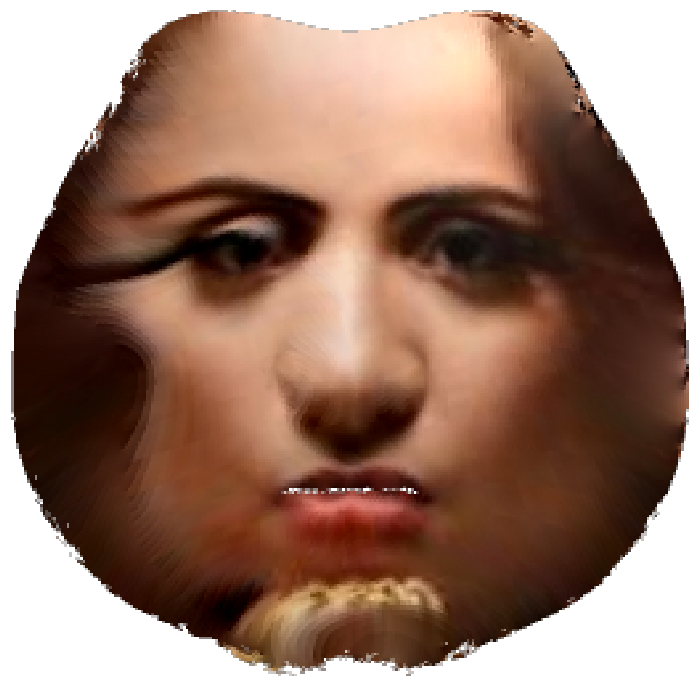

300w01_indoor_004_m.png
HERE
(256, 256)
(256, 256, 4)


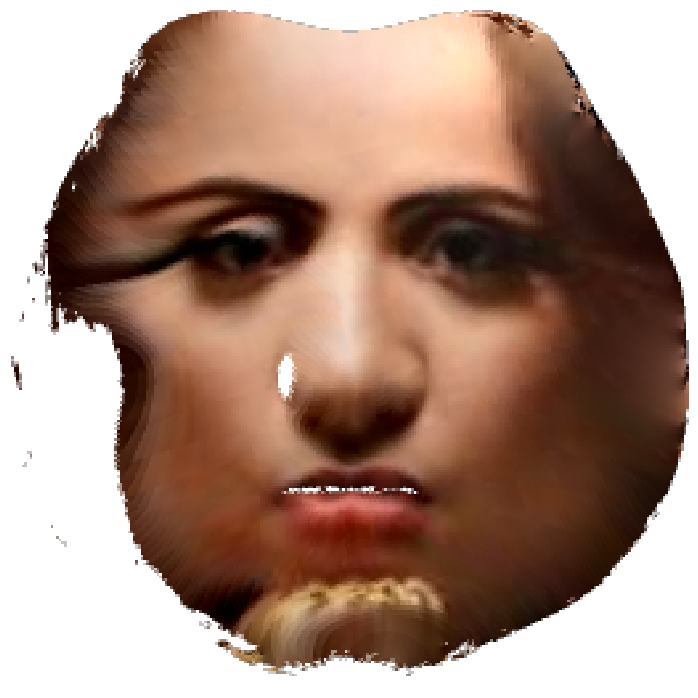

In [63]:

def read_image_OpenCV(path, is_pair=False, target_size=None):
        im = cv2.imread(path, cv2.IMREAD_UNCHANGED)
        if target_size: im = cv2.resize(im, target_size)
        else: im = cv2.resize(im, (256, 256))
        return im

def load_original_mask(im, im_path, images_mask_fname_list, images_mask_path):
    
    im_fname = im_path.split('/')[-1]
    print(im_fname)
    if im_fname in images_mask_fname_list:
        print('HERE')
        mask_path = Path(images_mask_path, im_fname)
        mask = read_image_OpenCV(str(mask_path)); print(mask.shape)
        im[:,:,3] = mask; print(im.shape)
    return im
    
if True: 
    images_mask_path = Path('training_datasets/pix2pix/images_mask')
    images_mask_fname_list = [i.parts[-1] for i in list(images_mask_path.glob('*.png'))]
                             
    im_path = 'training_datasets/pix2pix/images_target_clean_classified/bad_fit/300w01_indoor_004_m.png'
    im = read_image_OpenCV(im_path)
    plot_im(im, alpha=True)
    im = load_original_mask(im, im_path, images_mask_fname_list, images_mask_path)
    plot_im(im, alpha=True)